In [1]:
#!/usr/bin/python
#import wradlib as wrl
import pylab as pl
from glob import glob
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()
import numpy as np

import csv
import os
import datetime
import pandas as pd

#shapefile: GIS vector data format (ESRI)
import shapefile as shp  # Requires the pyshp package
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import ticker
import netCDF4 as nc4
from datetime import date,timedelta
import plotly.graph_objs as go
import matplotlib.lines as mlines
import seaborn as sns
import shapely as shp
from shapely.geometry import Point

import importlib
import geopandas as gpd
from matplotlib.patches import Rectangle
from collections import Counter

import _pickle as pickle
from mpl_toolkits.axes_grid1 import make_axes_locatable

#import external functions (need pip install ipynb)
import ipynb.fs.full.HaileventsFunctions as HF

In [2]:
#Folder address containing data:
fold = '/home/ciccuz/phd/KIT/hail_data/'

## Scripts to investigate nature of the datasets:

In [3]:
#Preliminar parameters:

#lat/lon coords to cover the whole SPHERA domain:
lonmin_S=6; lonmax_S=19; latmin_S=35; latmax_S=49
latplot_S=[latmin_S,latmax_S]; lonplot_S=[lonmin_S,lonmax_S]

#With geopandas: NEW VERSION!
sfg_ita = gpd.read_file(fold + "hail4_punge/geodata/ITA_adm/ITA_adm0.shp", encoding='latin-1')
sfg_deu = gpd.read_file(fold + "hail4_punge/geodata/DEU_adm/DEU_adm0.shp", encoding='latin-1')
sfg_aut = gpd.read_file(fold + "hail4_punge/geodata/AUT_adm/AUT_adm0.shp", encoding='latin-1')
sfg_che = gpd.read_file(fold + "hail4_punge/geodata/CHE_adm/CHE_adm0.shp", encoding='latin-1')
sfg_cro = gpd.read_file(fold + "hail4_punge/geodata/Croatia/mj788hg8036.shp", encoding='latin-1')
sfg_slo = gpd.read_file(fold + "hail4_punge/geodata/Slovenia/gk259nt7452.shp", encoding='latin-1')
sfg_hun = gpd.read_file(fold + "hail4_punge/geodata/Hungary/qh513vs8921.shp", encoding='latin-1')
sfg_alg = gpd.read_file(fold + "hail4_punge/geodata/algeria/rt767cn2098.shp", encoding='latin-1')
sfg_tun = gpd.read_file(fold + "hail4_punge/geodata/tunisia/TUN_adm0.shp", encoding='latin-1')
sfg_bos = gpd.read_file(fold + "hail4_punge/geodata/bosnia/bt512fj0408.shp", encoding='latin-1')
sfg_fra = gpd.read_file(fold + "hail4_punge/geodata/france/dw125xh0996.shp", encoding='latin-1')
sfg_mon = gpd.read_file(fold + "hail4_punge/geodata/montenegro/MNE_adm0.shp", encoding='latin-1')
sfg_cze = gpd.read_file(fold + "hail4_punge/geodata/czech/CZE_adm0.shp", encoding='latin-1')
sfg_svk = gpd.read_file(fold + "hail4_punge/geodata/slovakia/SVK_adm0.shp", encoding='latin-1')

#read shapefile of SPHERA 10km grid:
sf_sp = gpd.read_file(fold + "data/lampinet/mask/grid_10_49N.shp", encoding='latin-1')

#maps limits whole SPHERA domain
x_lim_S=lonplot_S
y_lim_S=latplot_S

x_lim = x_lim_S
y_lim = y_lim_S

clonsel, clatsel, csizesel, cnamesel, ckindsel = HF.HF_cities(latmin_S,latmax_S,lonmin_S,lonmax_S)

#shapefile in vector form for considering multiple geographic shapefiles
sf_geo = [sfg_ita, sfg_aut, sfg_deu, sfg_che, sfg_cro, sfg_slo, sfg_hun, sfg_alg, sfg_tun, sfg_fra, sfg_bos,
          sfg_mon, sfg_cze, sfg_svk]

#### - ESWD

Considered are only events having quality control >QC0+ (i.e. QC0+: reports that passed a basic plausibility check, QC1 reports is confirmed by a reliable source, QC2 reports based on detailed case studies on a scientific level (very rare)).

How many events are present in the period 2016-2018 over the whole SPHERA domain? **1450**, (**332** of which are QC0+, **1048** are QC1 and **16** are QC2)

**10** events are removed because they are too close to SPHERA border domain to be considered (Events to be withdrawn (because too close to SPHERA border to be analyzed): -10 (indices 128 316 327 328 330 507 632 883 884 929)

How many during the extended summer season (apr-oct)? **1386** i.e. 96% of the data (over **228** different days), of which: **327** are QC0+ and **1044 + 15** are QC1 or QC2)


Of which: **432** in 2016, **476** in 2017, **478** in 2018 

How many of them have information on size of hail? **1050**

How many eswd events happened in Italy (2016-2018, Apr-Oct)? **434**

How many events had different hail sizes (over 2016-2018, Apr-Oct, full SPHERA domain):
   
   - no info on hail size: **336**
   - hail size <3cm: **400**
   - hail size >=3cm: **650**
   - hail size >=5cm **175**

In [4]:
eswd[(eswd['QC_level'] != 'QC0+') & (eswd.datetime.dt.year ==2018)]

NameError: name 'eswd' is not defined

In [5]:
df_eswd = pd.read_csv(fold + 'hail4_punge/ESWD/ESWD_HAIL_19790101-20200531_v1_6.csv')   #Swabian Jura 2013

In [25]:
df_eswd.keys()

Index(['ID', 'QC_LEVEL', 'INFO_SOURCE', 'CONTACT', 'EMAIL', 'ORGANISATION',
       'ORGANISATION_ID', 'NO_REVISION', 'PERSON_REVISION', 'TIME_EVENT',
       'TIME_CREATION', 'TIME_LAST_REVISION', 'TIME_ACCURACY', 'COUNTRY',
       'STATE', 'PLACE', 'PLACE_LOCAL_LANGUAGE', 'DETAILED_LOCATION',
       'NEAREST_CITY', 'LATITUDE', 'LONGITUDE', 'PLACE_ACCURACY', 'OROGRAPHY',
       'SURFACE_INITIAL_LOCATION', 'SURFACE_CROSSED', 'TYPE_EVENT',
       'NO_OBJECTS', 'MAX_HAIL_DIAMETER', 'MAX_HAILSTONE_WEIGHT',
       'AVERAGE_HAIL_DIAMETER', 'THICKNESS_HAIL_LAYER', 'HAILSTONE', 'F_SCALE',
       'T_SCALE', 'RATING_BASIS', 'WIND_SPEED', 'TEN_MIN_WIND_SPEED',
       'FUNNEL_SIGHTED', 'SUCTION_VORTICES', 'PRECIPITATION_AMOUNT',
       'SNOW_FALL_AMOUNT', 'PEAK_PRECIP_AMOUNT', 'PEAK_SNOW_FALL_AMOUNT',
       'PEAK_PRECIP_PERIOD', 'MAX_6_HOUR_PRECIP', 'MAX_6_HOUR_SNOW_FALL',
       'MAX_12_HOUR_PRECIP', 'MAX_12_HOUR_SNOW_FALL', 'MAX_24_HOUR_PRECIP',
       'MAX_24_HOUR_SNOW_FALL', 'CONVECTIVE', 'TOT

In [6]:
eswd_df = pd.DataFrame(columns=['datetime','lat','lon','size','QC_level'])
eswd_df['datetime'] = pd.to_datetime(df_eswd['TIME_EVENT'])
eswd_df['lat'] = df_eswd['LATITUDE']
eswd_df['lon'] = df_eswd['LONGITUDE']
eswd_df['size'] = df_eswd['MAX_HAIL_DIAMETER']
eswd_df['QC_level'] = df_eswd['QC_LEVEL']
eswd_df['Time_accuracy'] = df_eswd['TIME_ACCURACY']
eswd_df['Max_hailst_weight'] = df_eswd['MAX_HAILSTONE_WEIGHT']
eswd_df['Thickness_hail_layer'] = df_eswd['THICKNESS_HAIL_LAYER']
eswd_df['Total_damage'] = df_eswd['TOTAL_DAMAGE']
eswd_df['N_injured'] = df_eswd['NO_INJURED']
eswd_df['N_killed'] = df_eswd['NO_KILLED']
eswd_df['Impacts'] = df_eswd['IMPACTS']

eswd_df = eswd_df.sort_values(by='datetime').reset_index(drop=True)

#try:retain only data in the selected day and year and within hhmin and hhmax, as well as within latmin,latmax and lonmin,lonmax
eswd_df_years = eswd_df.datetime.apply(lambda x: x.year)
eswd_df_months = eswd_df.datetime.apply(lambda x: x.month)
eswd_df_days = eswd_df.datetime.apply(lambda x: x.day)
eswd_df_hours = eswd_df.datetime.apply(lambda x: x.hour)

eswd_df_sel = eswd_df.loc[(eswd_df_years >= 2016) & (eswd_df_years <= 2018) & (eswd_df_months >= 4)   #(eswd_df_years >= 1995) &
                         & (eswd_df_months <= 10)]
eswd_df_sel = eswd_df_sel.loc[(eswd_df_sel.lat >= latmin_S) & (eswd_df_sel.lat <= latmax_S)]
eswd_ev_sel = eswd_df_sel.loc[(eswd_df_sel.lon >= lonmin_S) & (eswd_df_sel.lon <= lonmax_S)].reset_index(drop=True)

#geodataframe:
eswd = gpd.GeoDataFrame(eswd_ev_sel, geometry=gpd.points_from_xy(eswd_ev_sel.lon, eswd_ev_sel.lat))

#remove data too close to sphera border!!:
L = [128,316,327,328,330,507,632,883,884,929]
eswd = eswd.drop(L)

#split eswd dataset in the years:
eswd_2016 = eswd[eswd.datetime.dt.year ==2016]
eswd_2017 = eswd[eswd.datetime.dt.year ==2017]
eswd_2018 = eswd[eswd.datetime.dt.year ==2018]

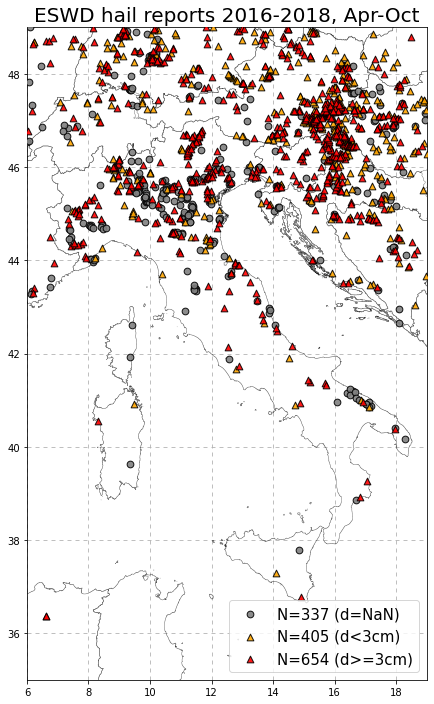

In [6]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)
    
'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
eswd_ev_sel_NOsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == True].reset_index(drop=True)
eswd_ev_sel_wsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == False].reset_index(drop=True)
eswd_ev_sel_small = eswd_ev_sel_wsize[eswd_ev_sel_wsize['size'] < 3]
eswd_ev_sel_big = eswd_ev_sel_wsize[eswd_ev_sel_wsize['size'] >= 3]


c3_1=pl.scatter(eswd_ev_sel_NOsize.lon,eswd_ev_sel_NOsize.lat,45,c='grey',
                marker="o",edgecolor='k',alpha=0.9,zorder=4, label='N=337 (d=NaN)')
c3_2=pl.scatter(eswd_ev_sel_small.lon,eswd_ev_sel_small.lat,45,
                c='orange',marker="^", edgecolor='k',alpha=0.9,zorder=4, label='N=405 (d<3cm)')
c3_2=pl.scatter(eswd_ev_sel_big.lon,eswd_ev_sel_big.lat,45,
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4, label='N=654 (d>=3cm)')

pl.legend(loc='best', fontsize=15)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct', fontsize=20);

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/ESWD-2016_2018.pdf', dpi=300, bbox_inches='tight')

#### - Considering additionally 2019 and 2020:
**879** additional reports are gained over SPHERA domain for 2016-2018 period, which are characterized by:

   - no info on hail size: **180**
   - small hail size <3cm: **263**
   - hail size >=3cm: **436**
   - large hail size >=5cm **114**

In [45]:
eswd_df_sel_2 = eswd_df.loc[(eswd_df_years >= 2019) & (eswd_df_years <= 2020) & (eswd_df_months >= 4)   #(eswd_df_years >= 1995) &
                         & (eswd_df_months <= 10)]
eswd_df_sel_2 = eswd_df_sel_2.loc[(eswd_df_sel_2.lat >= latmin_S) & (eswd_df_sel_2.lat <= latmax_S)]
eswd_ev_sel_2 = eswd_df_sel_2.loc[(eswd_df_sel_2.lon >= lonmin_S) & (eswd_df_sel_2.lon <= lonmax_S)].reset_index(drop=True)
eswd_ev_sel_2

,datetime,lat,lon,size,QC_level
0,2019-04-03 14:30:00,43.633,6.999,NaN,QC1
1,2019-04-08 13:10:00,40.245,16.470,NaN,QC1
2,2019-04-10 10:45:00,42.211,14.184,NaN,QC0+
3,2019-04-10 13:00:00,45.566,11.153,0.5,QC0+
4,2019-04-10 17:00:00,45.524,18.109,1.0,QC1
...,...,...,...,...,...
874,2020-06-16 17:00:00,45.629,8.539,2.0,QC1
875,2020-06-17 13:00:00,44.615,10.269,2.0,QC1
876,2020-06-17 15:00:00,40.799,17.352,2.0,QC1
877,2020-06-17 16:00:00,44.957,7.667,2.0,QC1


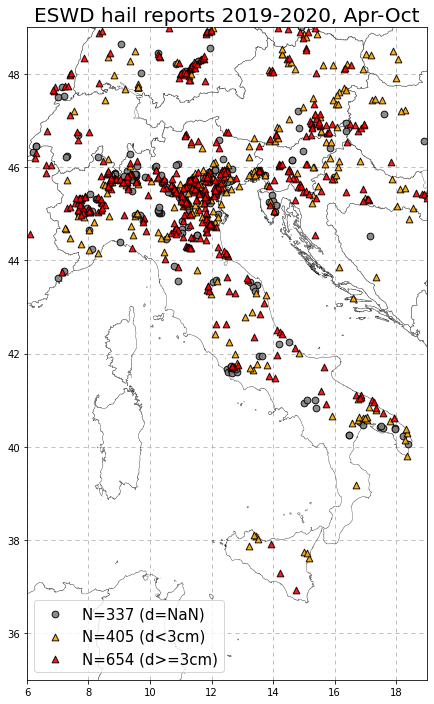

In [46]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)
    
'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
eswd_ev_sel_2_NOsize = eswd_ev_sel_2.loc[np.isnan(eswd_ev_sel_2['size']) == True].reset_index(drop=True)
eswd_ev_sel_2_wsize = eswd_ev_sel_2.loc[np.isnan(eswd_ev_sel_2['size']) == False].reset_index(drop=True)
eswd_ev_sel_2_small = eswd_ev_sel_2_wsize[eswd_ev_sel_2_wsize['size'] < 3]
eswd_ev_sel_2_big = eswd_ev_sel_2_wsize[eswd_ev_sel_2_wsize['size'] >= 3]


c3_1=pl.scatter(eswd_ev_sel_2_NOsize.lon, eswd_ev_sel_2_NOsize.lat, 45,c='grey',
                marker="o",edgecolor='k',alpha=0.9,zorder=4, label='N=337 (d=NaN)')
c3_2=pl.scatter(eswd_ev_sel_2_small.lon, eswd_ev_sel_2_small.lat,45,
                c='orange',marker="^", edgecolor='k',alpha=0.9,zorder=4, label='N=405 (d<3cm)')
c3_2=pl.scatter(eswd_ev_sel_2_big.lon, eswd_ev_sel_2_big.lat,45,
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4, label='N=654 (d>=3cm)')

pl.legend(loc='best', fontsize=15)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2019-2020, Apr-Oct', fontsize=20);

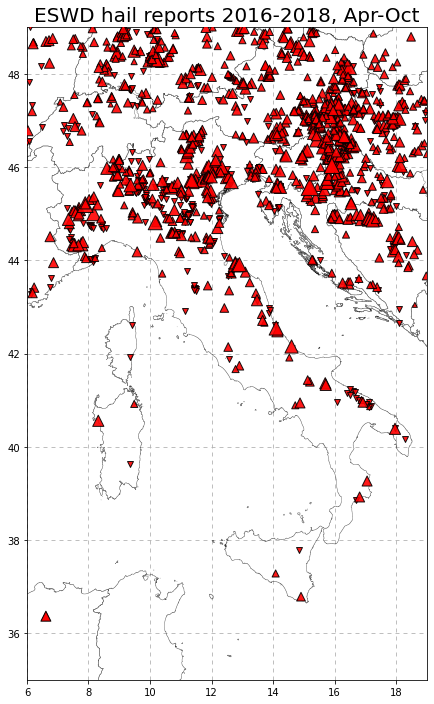

In [9]:
fig, ax = plt.subplots(figsize = (15,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
eswd_ev_sel_NOsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == True].reset_index(drop=True)
eswd_ev_sel_wsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == False].reset_index(drop=True)

c3_1=pl.scatter(eswd_ev_sel_NOsize.lon,eswd_ev_sel_NOsize.lat,35,c='red',
                marker="v",edgecolor='k',alpha=0.9,zorder=4)
c3_2=pl.scatter(eswd_ev_sel_wsize.lon,eswd_ev_sel_wsize.lat,25*eswd_ev_sel_wsize['size'],
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct', fontsize=20);


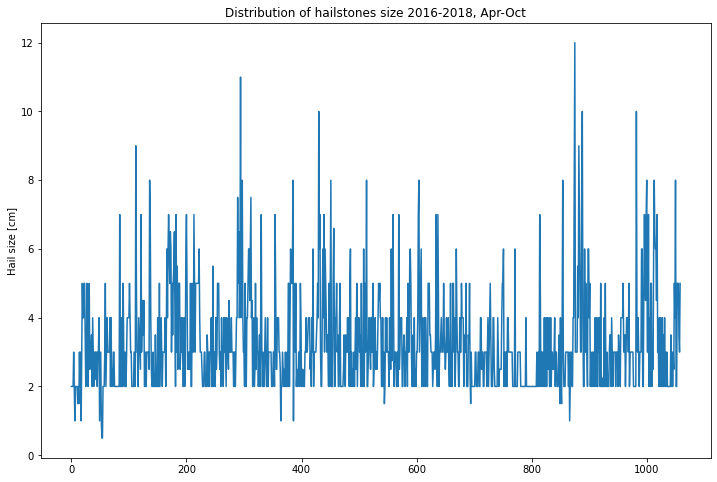

In [10]:
#Distribution of size of hail for events having info on size
fig, ax = plt.subplots(figsize = (12,8))
plt.plot(eswd_ev_sel.loc[eswd_ev_sel['size'].isnull() != True].reset_index().index, 
         eswd_ev_sel.loc[eswd_ev_sel['size'].isnull() != True]['size'])
plt.ylabel('Hail size [cm]')
plt.title('Distribution of hailstones size 2016-2018, Apr-Oct');

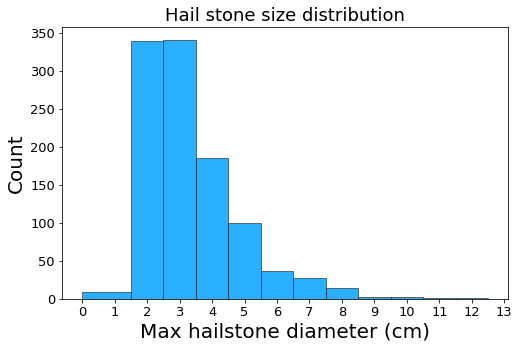

In [9]:
eswd_wSize = eswd_ev_sel.loc[eswd_ev_sel['size'].isnull() != True].reset_index(drop=True)

#Histogram of hail stone size distribution in ESWD events:
plt.figure(figsize=(8,5)) 

plt.hist(eswd_wSize['size'], bins=[0,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5],
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=15)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Max hailstone diameter (cm)', fontsize=20)
plt.title('Hail stone size distribution', fontsize=18);
plt.tick_params(axis='both', which='major', labelsize=13)

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/ESWD-2016_2018_hailstoneSize.png', dpi=300, bbox_inches='tight')

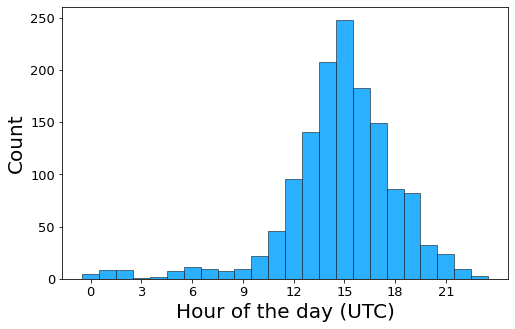

In [12]:
#Histogram of hailstorm distribution dep. on the hour of the day in ESWD events:
plt.figure(figsize=(8,5)) 

plt.hist(eswd_ev_sel['datetime'].dt.hour, bins=np.arange(25)-0.5,
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
plt.xticks(np.arange(0, 24, 3))

plt.ylabel('Count', fontsize=20)
plt.xlabel('Hour of the day (UTC)', fontsize=20)
#plt.title('ESWD hail events distr. vs hour of the day (2016-2018,Apr-Oct)', fontsize=15);
plt.tick_params(axis='both', which='major', labelsize=13)

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/ESWD-2016_2018_hour.png', dpi=300, bbox_inches='tight')

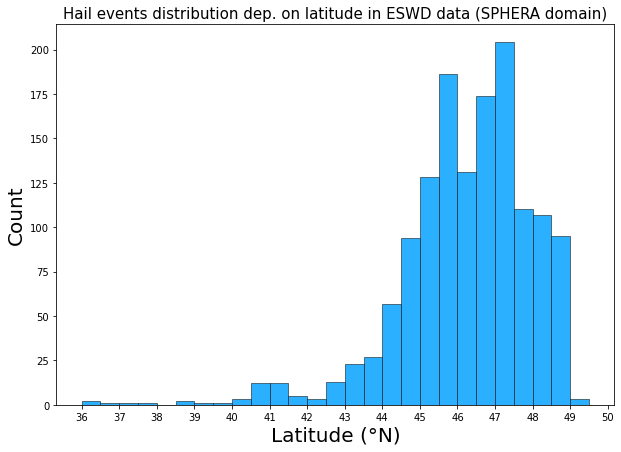

In [13]:
#Histogram of hailstorm distribution dep. latitude in ESWD events:
plt.figure(figsize=(10,7)) 

plt.hist(eswd_ev_sel['lat'], bins=np.arange(36,50,.5),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Latitude (°N)', fontsize=20)
plt.title('Hail events distribution dep. on latitude in ESWD data (SPHERA domain)', fontsize=15);

In [6]:
import matplotlib.ticker as ticker

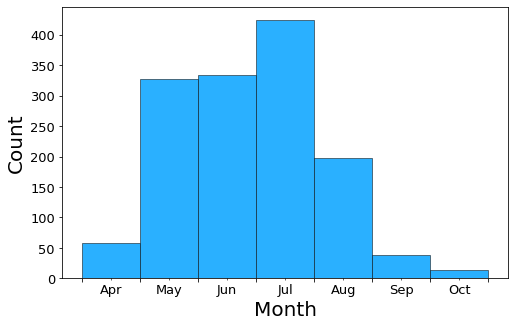

In [114]:
#Histogram of hailstorm distribution dep. MONTH in ESWD events:
fig, ax = plt.subplots(figsize = (8,5))

plt.hist(eswd_ev_sel.datetime.dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)


ax.set_xticklabels('')
ax.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5],      minor=True)
ax.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Month', fontsize=20)
#plt.title('ESWD hail events distr. vs Month (2016-2018,Apr-Oct)', fontsize=15);
plt.tick_params(axis='both', which='major', labelsize=13)
plt.tick_params(axis='both', which='minor', labelsize=13)

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/ESWD-2016_2018_month.png', dpi=300, bbox_inches='tight')

Try masking ESWD data considering shapefile only over Italy -> 

https://towardsdatascience.com/masking-geo-spatial-level-3-satellite-images-using-shapefiles-a-grid-based-approach-c88d7a108f4a

https://www.guillaumedueymes.com/post/shapefiles_country/

In [14]:
#load shapefile with geopandas
ita = gpd.read_file(fold + "hail4_punge/geodata/ITA_adm/ITA_adm0.shp", encoding='latin-1')
aut = gpd.read_file(fold + "hail4_punge/geodata/AUT_adm/AUT_adm0.shp", encoding='latin-1')
ita.head()

,ID_0,ISO,NAME_ENGLI,NAME_ISO,NAME_FAO,NAME_LOCAL,NAME_OBSOL,NAME_VARIA,NAME_NONLA,NAME_FRENC,...,CONTAINS,SOVEREIGN,ISO2,WWW,FIPS,ISON,VALIDFR,VALIDTO,EUmember,geometry
0,112,ITA,Italy,ITALY,Italy,Italia,None,None,None,Italie,...,Trieste,Italy,IT,None,IT,380.0,1946,Present,1.0,"MULTIPOLYGON (((12.53764 35.52986, 12.53764 35..."


In [9]:
eswd_wTaccuracy = eswd.loc[eswd['Time_accuracy'].isnull() != True].reset_index(drop=True)

- Now to mask **points** and non-gridded data (like eswd) we must create a new column "geometry" in its pandas DataFrame made of shapely points objects given by the lat/lon couples: https://gis.stackexchange.com/questions/404196/create-a-column-geometry-of-points-with-longitude-and-latitude-data-given-in-a

In [14]:
#count occurrences of different temporal accuracies in hail reports
eswd_timeAcc_counter = Counter(eswd_wTaccuracy['Time_accuracy'])
eswd_timeAcc_counter

Counter({'5M': 367,
         '30M': 233,
         '15M': 531,
         '3H': 30,
         '1H': 115,
         '6H': 1,
         '12H': 1})

In [15]:
time_arr_class = [eswd_timeAcc_counter['5M'], eswd_timeAcc_counter['15M'], eswd_timeAcc_counter['30M'],
            eswd_timeAcc_counter['1H'], eswd_timeAcc_counter['3H'], eswd_timeAcc_counter['6H'],
            eswd_timeAcc_counter['12H']]

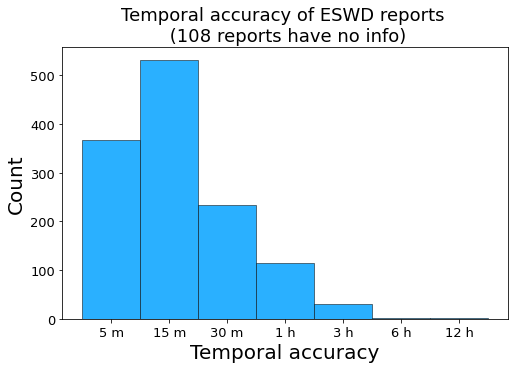

In [16]:
fig, ax = plt.subplots(figsize = (8,5))
#Histogram of hail stone size distribution in ESWD events:

plt.bar(['5 m','15 m','30 m','1 h','3 h','6 h','12 h'], time_arr_class, 
        facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5, width=1)
#pl.locator_params(axis='x', nbins=8)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Temporal accuracy', fontsize=20)
plt.title('Temporal accuracy of ESWD reports \n (108 reports have no info)', fontsize=18);
plt.tick_params(axis='both', which='major', labelsize=13)

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/ESWD-2016_2018_tempAccuracy.png', 
#            dpi=300, bbox_inches='tight')

In [17]:
eswd_wTaccuracy

,datetime,lat,lon,size,QC_level,Time_accuracy,Max_hailst_weight,Thickness_hail_layer,Total_damage,N_injured,N_killed,Impacts,geometry
0,2016-04-06 15:55:00,46.993,13.150,NaN,QC0+,5M,NaN,2.0,NaN,NaN,NaN,NaN,POINT (13.15000 46.99300)
1,2016-04-07 06:30:00,45.815,9.571,NaN,QC1,30M,NaN,2.0,NaN,NaN,NaN,NaN,POINT (9.57100 45.81500)
2,2016-04-07 19:20:00,46.167,8.800,2.0,QC1,15M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (8.80000 46.16700)
3,2016-04-08 04:05:00,48.350,17.567,2.0,QC0+,5M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (17.56700 48.35000)
4,2016-04-08 14:30:00,45.117,7.308,NaN,QC1,30M,NaN,5.0,NaN,NaN,NaN,NaN,POINT (7.30800 45.11700)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,2018-10-01 15:30:00,43.433,6.733,NaN,QC0+,1H,NaN,NaN,NaN,NaN,NaN,NaN,POINT (6.73300 43.43300)
1274,2018-10-07 12:00:00,40.158,18.292,NaN,QC0+,15M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (18.29200 40.15800)
1275,2018-10-21 16:00:00,42.142,12.541,3.0,QC0+,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.54100 42.14200)
1276,2018-10-21 18:00:00,41.888,12.565,NaN,QC0+,1H,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.56500 41.88800)


In [18]:
asd = eswd_wTaccuracy[(eswd_wTaccuracy['Time_accuracy'] != '3H') & (eswd_wTaccuracy['Time_accuracy'] != '6H') &
               (eswd_wTaccuracy['Time_accuracy'] != '12H')]

In [22]:
asd[asd.datetime.dt.year == 2018]

,datetime,lat,lon,size,QC_level,Time_accuracy,Max_hailst_weight,Thickness_hail_layer,Total_damage,N_injured,N_killed,Impacts,geometry
814,2018-04-12 12:45:00,45.184,9.161,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.16100 45.18400)
815,2018-04-12 14:15:00,45.001,9.402,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.40200 45.00100)
816,2018-04-12 14:15:00,44.947,9.405,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.40500 44.94700)
817,2018-04-12 14:15:00,45.058,9.433,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.43300 45.05800)
818,2018-04-12 14:15:00,45.014,9.443,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.44300 45.01400)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,2018-10-01 15:30:00,43.433,6.733,NaN,QC0+,1H,NaN,NaN,NaN,NaN,NaN,NaN,POINT (6.73300 43.43300)
1274,2018-10-07 12:00:00,40.158,18.292,NaN,QC0+,15M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (18.29200 40.15800)
1275,2018-10-21 16:00:00,42.142,12.541,3.0,QC0+,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.54100 42.14200)
1276,2018-10-21 18:00:00,41.888,12.565,NaN,QC0+,1H,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.56500 41.88800)


In [84]:
asd[(asd['QC_level'] != 'QC0+') & (asd.datetime.dt.year == 2018)]

,datetime,lat,lon,size,QC_level,Time_accuracy,Max_hailst_weight,Thickness_hail_layer,Total_damage,N_injured,N_killed,Impacts,geometry
814,2018-04-12 12:45:00,45.184,9.161,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.16100 45.18400)
815,2018-04-12 14:15:00,45.001,9.402,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.40200 45.00100)
816,2018-04-12 14:15:00,44.947,9.405,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.40500 44.94700)
817,2018-04-12 14:15:00,45.058,9.433,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.43300 45.05800)
818,2018-04-12 14:15:00,45.014,9.443,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.44300 45.01400)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1263,2018-09-07 14:20:00,41.365,15.694,5.0,QC1,15M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (15.69400 41.36500)
1264,2018-09-07 14:40:00,41.330,15.711,5.0,QC1,15M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (15.71100 41.33000)
1265,2018-09-18 15:35:00,48.133,8.333,3.5,QC1,5M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (8.33300 48.13300)
1271,2018-10-01 14:00:00,44.463,7.374,NaN,QC1,1H,NaN,NaN,NaN,NaN,NaN,NaN,POINT (7.37400 44.46300)


In [64]:
1278+108

1386

In [72]:
asd = eswd_wTaccuracy[(eswd_wTaccuracy['Time_accuracy'] == '3H') | (eswd_wTaccuracy['Time_accuracy'] == '6H') |
               (eswd_wTaccuracy['Time_accuracy'] == '12H')]
asd['QC_level']

12       QC1
73       QC1
78       QC1
79       QC1
80       QC1
81       QC1
82       QC1
83       QC1
336      QC1
348      QC1
400      QC1
401      QC1
402      QC1
403      QC1
412      QC1
417      QC1
443      QC2
592     QC0+
681     QC0+
927     QC0+
928      QC1
934      QC1
1192     QC1
1193     QC1
1194     QC1
1221     QC1
1224    QC0+
1266     QC1
1267     QC1
1268     QC1
1269     QC1
1270     QC1
Name: QC_level, dtype: object

In [73]:
len(asd)

32

In [67]:
1246/1386

0.898989898989899

In [16]:
#use gpd.clip to retain all the POINTS falling into the ita shapefile:
ita_eswd = gpd.clip(eswd_ev_sel, ita)
aut_eswd = gpd.clip(eswd_ev_sel, aut)

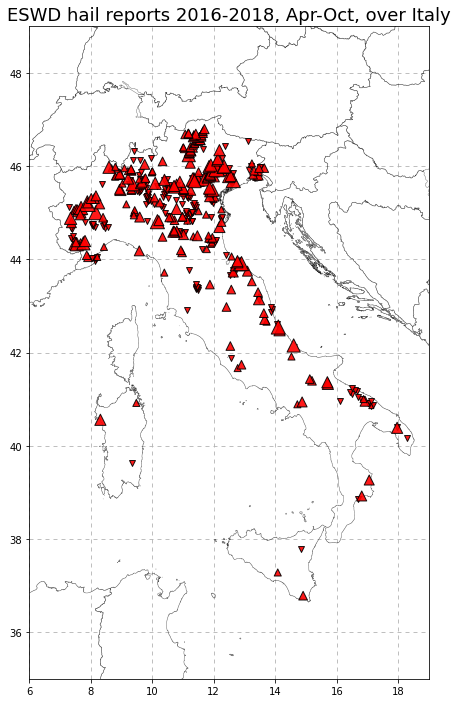

In [17]:
fig, ax = plt.subplots(figsize = (15,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
ita_eswd_NOsize = ita_eswd.loc[np.isnan(ita_eswd['size']) == True].reset_index(drop=True)
ita_eswd_wsize = ita_eswd.loc[np.isnan(ita_eswd['size']) == False].reset_index(drop=True)

c3_1=pl.scatter(ita_eswd_NOsize.lon,ita_eswd_NOsize.lat,35,c='red',
                marker="v",edgecolor='k',alpha=0.9,zorder=4)
c3_2=pl.scatter(ita_eswd_wsize.lon,ita_eswd_wsize.lat,25*ita_eswd_wsize['size'],
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct, over Italy', fontsize=18);

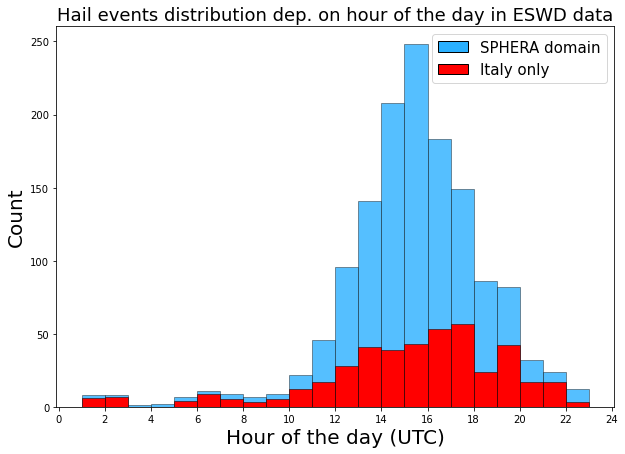

In [18]:
#Histogram of hailstorm distribution dep. on the hour of the day in ESWD events:
plt.figure(figsize=(10,7)) 

c_Sphera = '#2ab0ff'
c_Ita = 'red'

plt.hist(eswd_ev_sel['datetime'].dt.hour, bins=np.arange(1,24,1),
         facecolor = c_Sphera, edgecolor='black', linewidth=0.5, alpha=0.8)
plt.hist(ita_eswd['datetime'].dt.hour, bins=np.arange(1,24,1),
         facecolor = c_Ita, edgecolor='black', linewidth=0.5,zorder=2)
pl.locator_params(axis='x', nbins=24)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Hour of the day (UTC)', fontsize=20)

handles = [Rectangle((0,0),1,1,color=c,ec="k") for c in [c_Sphera,c_Ita]]
labels= ["SPHERA domain","Italy only"]
plt.legend(handles, labels, fontsize=15)

plt.title('Hail events distribution dep. on hour of the day in ESWD data', fontsize=18);

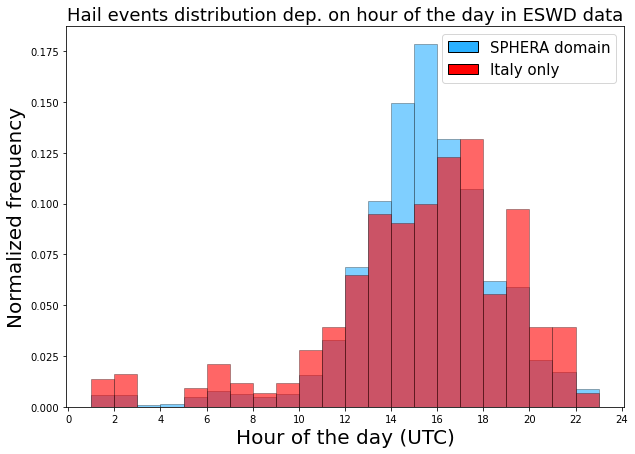

In [19]:
#Histogram of hailstorm distribution dep. on the hour of the day in ESWD events:
plt.figure(figsize=(10,7)) 

c_Sphera = '#2ab0ff'
c_Ita = 'red'

plt.hist(eswd_ev_sel['datetime'].dt.hour, bins=np.arange(1,24,1), density=True,
         facecolor = c_Sphera, edgecolor='black', linewidth=0.5, alpha=0.6)
plt.hist(ita_eswd['datetime'].dt.hour, bins=np.arange(1,24,1), density=True,
         facecolor = c_Ita, edgecolor='black', linewidth=0.5,zorder=2, alpha=0.6)
pl.locator_params(axis='x', nbins=24)

plt.ylabel('Normalized frequency', fontsize=20)
plt.xlabel('Hour of the day (UTC)', fontsize=20)

handles = [Rectangle((0,0),1,1,color=c,ec="k") for c in [c_Sphera,c_Ita]]
labels= ["SPHERA domain","Italy only"]
plt.legend(handles, labels, fontsize=15)

plt.title('Hail events distribution dep. on hour of the day in ESWD data', fontsize=18);

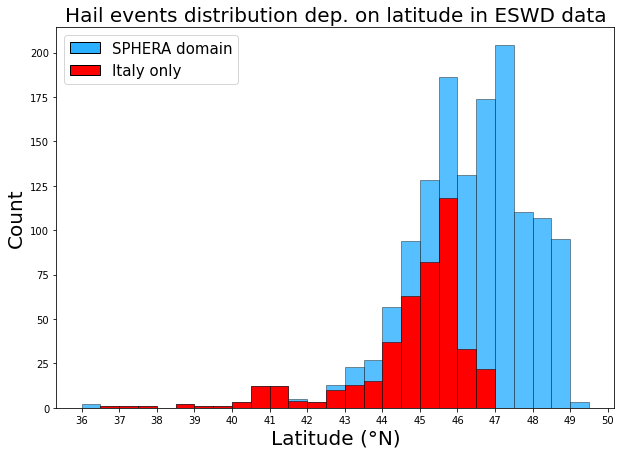

In [20]:
#Histogram of hailstorm distribution dep. latitude in ESWD events:
plt.figure(figsize=(10,7)) 

c_Sphera = '#2ab0ff'
c_Ita = 'red'

plt.hist(eswd_ev_sel['lat'], bins=np.arange(36,50,.5),
         facecolor = c_Sphera, edgecolor='black', linewidth=0.5, alpha=0.8)
plt.hist(ita_eswd['lat'], bins=np.arange(36,50,.5),
         facecolor = c_Ita, edgecolor='black', linewidth=0.5,zorder=2)

pl.locator_params(axis='x', nbins=24)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Latitude (°N)', fontsize=20)

handles = [Rectangle((0,0),1,1,color=c,ec="k") for c in [c_Sphera,c_Ita]]
labels= ["SPHERA domain","Italy only"]
plt.legend(handles, labels, fontsize=15)

plt.title('Hail events distribution dep. on latitude in ESWD data', fontsize=20);

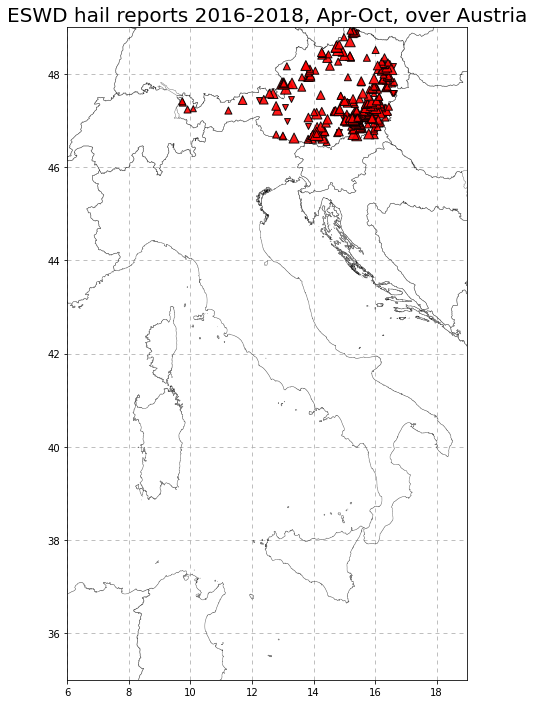

In [21]:
fig, ax = plt.subplots(figsize = (15,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)
    
'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
aut_eswd_NOsize = aut_eswd.loc[np.isnan(aut_eswd['size']) == True].reset_index(drop=True)
aut_eswd_wsize = aut_eswd.loc[np.isnan(aut_eswd['size']) == False].reset_index(drop=True)

c3_1=pl.scatter(aut_eswd_NOsize.lon,aut_eswd_NOsize.lat,35,c='red',
                marker="v",edgecolor='k',alpha=0.9,zorder=4)
c3_2=pl.scatter(aut_eswd_wsize.lon,aut_eswd_wsize.lat,25*aut_eswd_wsize['size'],
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct, over Austria', fontsize=20);

#### - UNIPOL
How many events are present in the period **2017**-2018 over the whole SPHERA domain? **28074**

How many during the extended summer season (apr-oct)? **27220** (i.e. 97%)

Over the whole period (2017-2020) in Apr-Oct there are **115.604** reports (i.e. 88384 only in 2019-2020)

In [14]:
df_unipol = pd.read_csv(fold + 'data/ESWD_insurance/Insurance_ESSL_Italy_data/original_ungridded_data/UNIPOL/Estrazione_SINISTRI_GRANDINE_E_VENTO_ITALIA_DateLatLon.csv')
dfu_ev_complete = pd.DataFrame()
dfu_ev_complete = df_unipol.loc[(df_unipol.month >= 4) & (df_unipol.month <= 10)].reset_index(drop=True)

u_ev_complete = pd.DataFrame(columns=['datetime','lon','lat'])
u_ev_complete['datetime'] = pd.to_datetime({'year': dfu_ev_complete['year'],'month':dfu_ev_complete['month'],
                                            'day':dfu_ev_complete['day'],'hour':dfu_ev_complete['hour'],
                                            'minute':dfu_ev_complete['min']})
u_ev_complete['lon'] = np.array(dfu_ev_complete.lon)
u_ev_complete['lat'] = np.array(dfu_ev_complete.lat)

u_ev_complete = u_ev_complete.sort_values(by='datetime').reset_index(drop=True)


In [11]:
#Read UNIPOL insurance data
df_unipol = pd.read_csv(fold + 'data/ESWD_insurance/Insurance_ESSL_Italy_data/original_ungridded_data/UNIPOL/Estrazione_SINISTRI_GRANDINE_E_VENTO_ITALIA_DateLatLon.csv')

#retain only data within the period considered
dfu_ev = pd.DataFrame()
dfu_ev = df_unipol.loc[(df_unipol.year >= 2016) & (df_unipol.year <= 2018) &
                      (df_unipol.month >= 4) & (df_unipol.month <= 10)].reset_index(drop=True)

#save date lat lon data in arrays
u_ev = pd.DataFrame(columns=['datetime','lon','lat'])
u_ev['datetime'] = pd.to_datetime({'year': dfu_ev['year'],'month':dfu_ev['month'],'day':dfu_ev['day'],'hour':dfu_ev['hour'],
               'minute':dfu_ev['min']})
u_ev['lon'] = np.array(dfu_ev.lon)
u_ev['lat'] = np.array(dfu_ev.lat)

u_ev = u_ev.sort_values(by='datetime').reset_index(drop=True)

u_ev_hours = u_ev.datetime.apply(lambda x: x.hour)

#u_ev_sel = u_ev.loc[(u_ev_hours >= hhmin) & (u_ev_hours < hhmax)]
u_ev_sel = u_ev.loc[(u_ev.lat >= latmin_S) & (u_ev.lat <= latmax_S)]
u_ev_sel = u_ev_sel.loc[(u_ev_sel.lon >= lonmin_S) & (u_ev_sel.lon <= lonmax_S)].reset_index(drop=True)

u_ev_sel = gpd.GeoDataFrame(u_ev_sel, geometry=gpd.points_from_xy(u_ev_sel.lon, u_ev_sel.lat)) 

#eswd data over different years:
u_ev_sel_2017 = u_ev_sel[u_ev_sel.datetime.dt.year == 2017].reset_index(drop=True)
u_ev_sel_2018 = u_ev_sel[u_ev_sel.datetime.dt.year == 2018].reset_index(drop=True)

In [6]:
u_ev_sel

,datetime,lon,lat,geometry
0,2017-04-15 17:00:00,7.893009,45.456619,POINT (7.89301 45.45662)
1,2017-04-15 17:06:00,7.679822,45.074093,POINT (7.67982 45.07409)
2,2017-04-16 10:00:00,12.029904,44.006611,POINT (12.02990 44.00661)
3,2017-04-16 18:30:00,11.477947,44.430923,POINT (11.47795 44.43092)
4,2017-04-17 00:01:00,11.309953,44.778538,POINT (11.30995 44.77854)
...,...,...,...,...
27215,2018-10-31 00:01:00,8.742714,45.435177,POINT (8.74271 45.43518)
27216,2018-10-31 09:00:00,9.199469,44.312763,POINT (9.19947 44.31276)
27217,2018-10-31 10:46:00,14.508273,40.781990,POINT (14.50827 40.78199)
27218,2018-10-31 16:00:00,8.852163,44.726948,POINT (8.85216 44.72695)


In [7]:
2286/27220

0.08398236590742102

In [5]:
u_ev_sel[u_ev_sel.datetime.dt.hour == 23]

,datetime,lon,lat,geometry
32,2017-06-15 23:00:00,8.970179,45.738869,POINT (8.97018 45.73887)
95,2017-06-27 23:00:00,8.018835,44.954479,POINT (8.01884 44.95448)
96,2017-06-27 23:00:00,7.785202,44.946934,POINT (7.78520 44.94693)
97,2017-06-27 23:00:00,7.631329,44.958027,POINT (7.63133 44.95803)
98,2017-06-27 23:00:00,7.936688,44.954197,POINT (7.93669 44.95420)
...,...,...,...,...
27135,2018-10-29 23:30:00,8.463366,45.129009,POINT (8.46337 45.12901)
27136,2018-10-29 23:30:00,8.646701,44.911941,POINT (8.64670 44.91194)
27137,2018-10-29 23:45:00,8.585335,44.839592,POINT (8.58533 44.83959)
27138,2018-10-29 23:45:00,8.463366,45.129009,POINT (8.46337 45.12901)


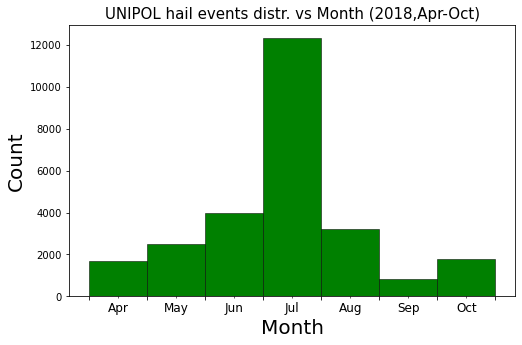

In [13]:
#Histogram of hailstorm distribution dep. MONTH in UNIPOL events:
fig, ax = plt.subplots(figsize = (8,5))

plt.hist(u_ev_sel_2018.datetime.dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)


ax.set_xticklabels('')
ax.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5],      minor=True)
ax.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Month', fontsize=20)
plt.title('UNIPOL hail events distr. vs Month (2018,Apr-Oct)', fontsize=15);


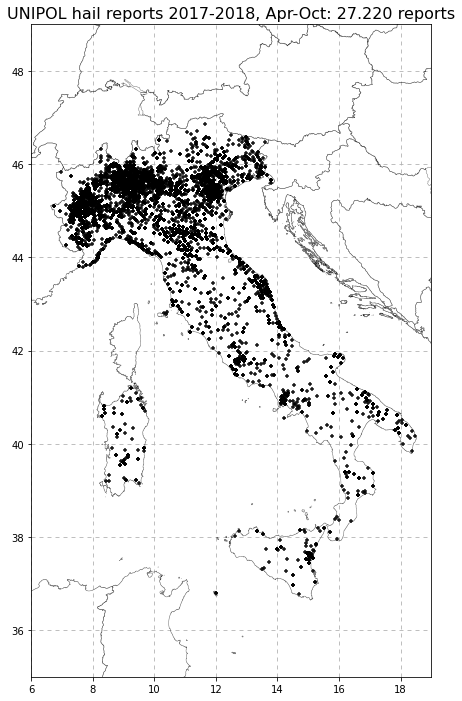

In [26]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)
    
'''
PLOT UNIPOL data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
c=pl.scatter(u_ev_sel.lon,u_ev_sel.lat,15,c='black',
                marker="+",edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('UNIPOL hail reports 2017-2018, Apr-Oct: 27.220 reports', fontsize=16);

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/UNIPOL-2017_2018.png', dpi=300, bbox_inches='tight')

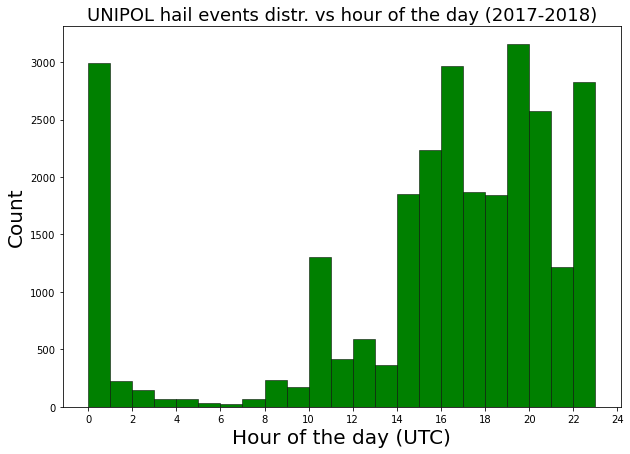

In [5]:
#Histogram of hailstorm distribution dep. on the hour of the day in UNIPOL events:
plt.figure(figsize=(10,7)) 

plt.hist(u_ev_sel['datetime'].dt.hour, bins=np.arange(0,24,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Hour of the day (UTC)', fontsize=20)
plt.title('UNIPOL hail events distr. vs hour of the day (2017-2018)', fontsize=18);

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/UNIPOL-2017_2018_hour.png',
#            dpi=300, bbox_inches='tight')

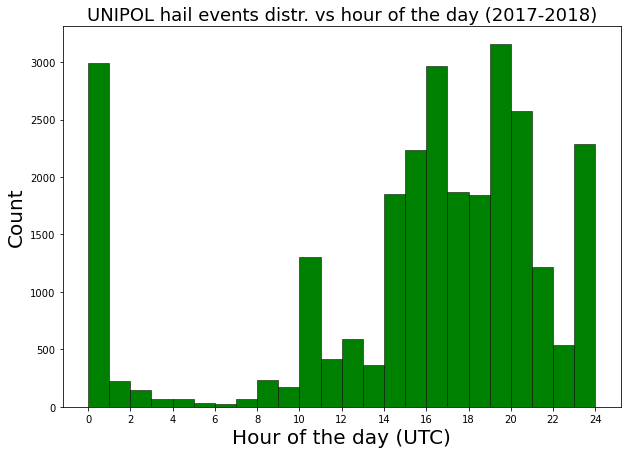

In [6]:
#Histogram of hailstorm distribution dep. on the hour of the day in UNIPOL events:
plt.figure(figsize=(10,7)) 

plt.hist(u_ev_sel['datetime'].dt.hour, bins=np.arange(0,25,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Hour of the day (UTC)', fontsize=20)
plt.title('UNIPOL hail events distr. vs hour of the day (2017-2018)', fontsize=18);


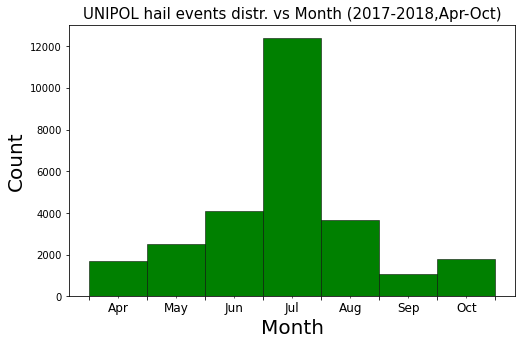

In [30]:
#Histogram of hailstorm distribution dep. MONTH in UNIPOL events:
fig, ax = plt.subplots(figsize = (8,5))

plt.hist(u_ev_sel.datetime.dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)


ax.set_xticklabels('')
ax.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5],      minor=True)
ax.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Month', fontsize=20)
plt.title('UNIPOL hail events distr. vs Month (2017-2018,Apr-Oct)', fontsize=15);

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd_unipol_reports/UNIPOL-2017_2018_month.png', 
            dpi=300, bbox_inches='tight')

### *The large number of reports shifted towards the late evening (23utc) and at 00UTC is most likely linked to a delayed time in reporting insurance reports for hailstorm events in UNIPOL dataset!!!*

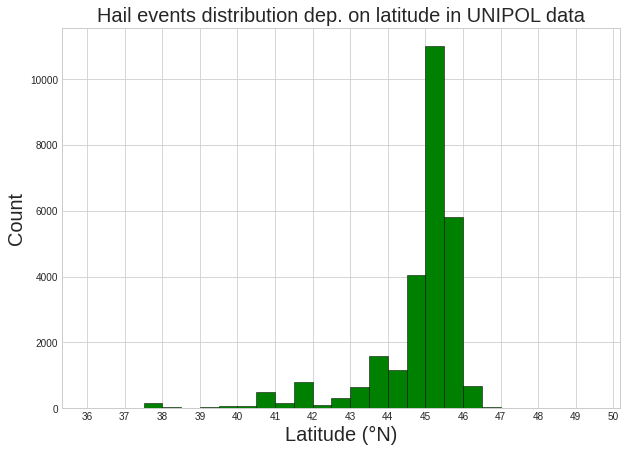

In [150]:
#Histogram of hailstorm distribution dep. latitude in UNIPOL events:
plt.figure(figsize=(10,7)) 

plt.hist(u_ev_sel['lat'], bins=np.arange(36,50,.5),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)

plt.ylabel('Count', fontsize=20)
plt.xlabel('Latitude (°N)', fontsize=20)
plt.title('Hail events distribution dep. on latitude in UNIPOL data', fontsize=20);

Spike of UNIPOL reports concentrated in northern Italy (45-45.5°N)

#### - ESWD (over Italy) vs UNIPOL reports: normalized freq histograms

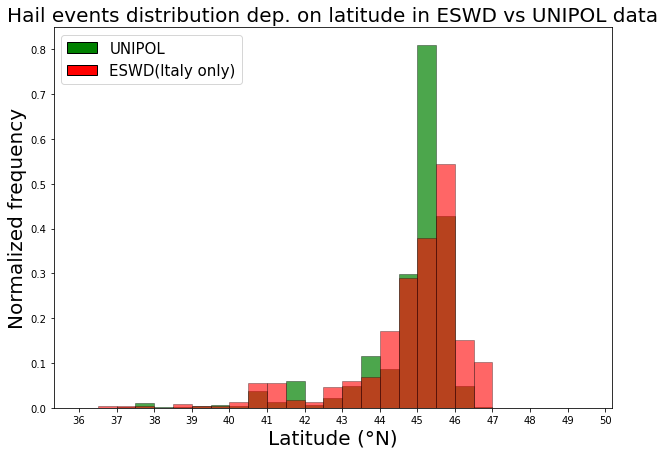

In [42]:
#Histogram of hailstorm distribution dep. latitude in ESWD vs UNIPOL events:
plt.figure(figsize=(10,7)) 

c_uni = 'green'
c_eswd = 'red'

plt.hist(u_ev_sel['lat'], bins=np.arange(36,50,.5), density=True,
         facecolor = c_uni, edgecolor='black', linewidth=0.5, alpha=0.7)
plt.hist(ita_eswd['lat'], bins=np.arange(36,50,.5), density=True,
         facecolor = c_eswd, edgecolor='black', linewidth=0.5,zorder=2, alpha=0.6)

pl.locator_params(axis='x', nbins=24)

plt.ylabel('Normalized frequency', fontsize=20)
plt.xlabel('Latitude (°N)', fontsize=20)

handles = [Rectangle((0,0),1,1,color=c,ec="k") for c in [c_uni,c_eswd]]
labels= ["UNIPOL","ESWD(Italy only)"]
plt.legend(handles, labels, fontsize=15)

plt.title('Hail events distribution dep. on latitude in ESWD vs UNIPOL data', fontsize=20);

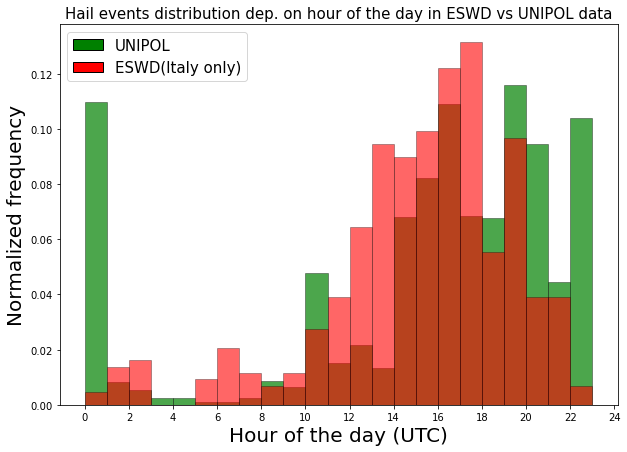

In [42]:
#Histogram of hailstorm distribution dep. on the hour of the day in ESWD vs UNIPOL events:
plt.figure(figsize=(10,7)) 

c_uni = 'green'
c_eswd = 'red'

plt.hist(u_ev_sel['datetime'].dt.hour, bins=np.arange(0,24,1), density=True,
         facecolor = c_uni, edgecolor='black', linewidth=0.5, alpha=0.7)
plt.hist(ita_eswd['datetime'].dt.hour, bins=np.arange(0,24,1), density=True,
         facecolor = c_eswd, edgecolor='black', linewidth=0.5,zorder=2, alpha=0.6)

pl.locator_params(axis='x', nbins=24)

plt.ylabel('Normalized frequency', fontsize=20)
plt.xlabel('Hour of the day (UTC)', fontsize=20)

handles = [Rectangle((0,0),1,1,color=c,ec="k") for c in [c_uni,c_eswd]]
labels= ["UNIPOL","ESWD(Italy only)"]
plt.legend(handles, labels, fontsize=15)

plt.title('Hail events distribution dep. on hour of the day in ESWD vs UNIPOL data', fontsize=15);

### - Problem SPHERA data plot! SOLVED and IMPLEMENTED

The leftmost column of SPHERA gridded data seems to be instead the rightmost: there seems to be a spatial shift of one grid towards left, maybe an index at the beginning of the plot is missing?? -> **SOLVED**: box_id started from 1 not from 0 shifting all the grid cells to the left of 1 place!

Also try to plot SPHERA data with shapefiles using geopandas! -> **DONE!** and much better now: much faster especially when plotting hourly data (no more kernel deaths after only 12 plots done!)

In [108]:
#read SPHERA data:
df_sp = HF.HF_reanProxies_read(2016, 8, 29)

df_sp_dayMax = df_sp.groupby(['box_id'], as_index=False).max().drop(columns=['datetime'])
df_sp_Hsel = df_sp_dayMax

In [109]:
df_sp

,datetime,box_id,%VV700,AvvGeop500,Kindex,LI,DLS,H0,CAPE_MU,CAPE_ML
0,2016-08-29 00:00:00,0,35.000000,35.509296,19.845850,6.446237,8.378888,4457.95605,0.012500,0.000000
1,2016-08-29 00:00:00,1,39.130436,63.493324,18.993925,6.735291,9.084085,4420.40234,0.048913,0.000000
2,2016-08-29 00:00:00,2,9.090909,52.867199,18.577543,5.802514,10.419735,4422.95459,0.073864,0.002841
3,2016-08-29 00:00:00,3,50.000000,-35.484413,19.071148,5.468991,7.878760,4458.85010,0.018750,0.000000
4,2016-08-29 00:00:00,4,60.000000,-31.424412,19.963497,6.674313,8.770734,4404.75635,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
435595,2016-08-29 23:00:00,18145,33.333332,0.000000,28.911448,0.088169,6.550601,3297.37500,177.083328,121.437500
435596,2016-08-29 23:00:00,18146,25.000000,0.000000,28.921570,0.187982,6.301708,3297.03125,166.250000,113.906250
435597,2016-08-29 23:00:00,18147,100.000000,0.000000,28.947906,0.263787,6.023411,3313.66675,158.166672,108.520836
435598,2016-08-29 23:00:00,18148,33.333332,0.000000,28.854197,0.330519,5.839781,3332.54175,147.333328,102.020836


In [110]:
sf_sp = gpd.read_file(fold + "data/lampinet/mask/grid_10_49N.shp", encoding='latin-1')

sp_par = "CAPE_MU"
col_num = 6
cbar_ext = 'max'
un_meas = '[J/kg]'

In [158]:
gdf_sp_sel = gpd.GeoDataFrame(df_sp_Hsel[["box_id",f"{sp_par}"]], 
                              geometry=sf_sp.loc[sf_sp.index[list(gdf_sp_4ESWDh['box_id'])]].reset_index(drop=True)['geometry'])
gdf_sp_sel

,box_id,CAPE_MU,geometry
0,0,244.074997,"POLYGON ((6.00000 35.00000, 6.00000 35.10000, ..."
1,1,129.793472,"POLYGON ((6.10000 35.00000, 6.10000 35.10000, ..."
2,2,103.170456,"POLYGON ((6.20000 35.00000, 6.20000 35.10000, ..."
3,3,84.818748,"POLYGON ((6.30000 35.00000, 6.30000 35.10000, ..."
4,4,104.218750,"POLYGON ((6.40000 35.00000, 6.40000 35.10000, ..."
...,...,...,...
18110,18145,1226.625000,"POLYGON ((13.50000 48.90000, 13.50000 49.00000..."
18111,18146,1234.937500,"POLYGON ((13.60000 48.90000, 13.60000 49.00000..."
18112,18147,1295.541630,"POLYGON ((13.70000 48.90000, 13.70000 49.00000..."
18113,18148,1425.416630,"POLYGON ((13.80000 48.90000, 13.80000 49.00000..."


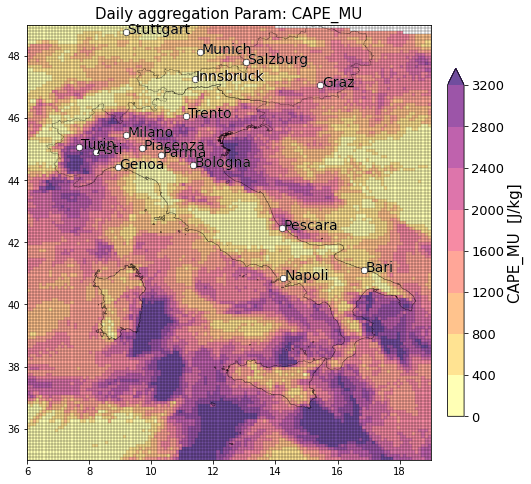

In [159]:
hourly=False

fig, ax = plt.subplots(figsize = (12,8))

if (x_lim != None) & (y_lim != None):     
    plt.xlim(x_lim)
    plt.ylim(y_lim)

#grid shapefile
sf_sp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.3, zorder=2)

#geographic shapefiles
sf_geo[0].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #ita shapefile
if len(sf_geo) > 1:
    sf_geo[1].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #other shapefile

#color-code grid cells for a certain parameter:
if sp_par == 'LI':
    col_num = 3
    un_meas = '[°C]'  #unit measure for colorbar label
    cbar_ext = 'max' #extension of the colorbar over defined ranges
elif sp_par == 'Kindex':
    col_num = 4
    cbar_ext = 'both'
    un_meas = '[°C]'
elif sp_par == '%VV700':
    col_num = 5
    cbar_ext = 'neither'
    un_meas = '%'
elif (sp_par == 'CAPE_MU') or (sp_par == 'CAPE_ML'):
    col_num = 6
    cbar_ext = 'max'
    un_meas = '[J/kg]'
elif sp_par == 'H0':
    col_num = 7
    cbar_ext = 'both'
    un_meas = '[m]'
elif sp_par == 'DLS':
    col_num = 8
    cbar_ext = 'both'
    un_meas = '[m/s]'

#calculate colorcoding dependent from the chosen parameter
col_boxes = gdf_sp_sel.box_id    
color_ton, bins, colors = HF.HF_calc_color(gdf_sp_sel[sp_par], color=col_num)

#plot geodataframe of SPHERA data with color_ton as colorcoding
gdf_sp_sel.plot(ax=ax, color=color_ton)

#add colorbar
cmap_sp_par = matplotlib.colors.ListedColormap(sns.color_palette(colors).as_hex())
norm = matplotlib.colors.BoundaryNorm(bins, cmap_sp_par.N, extend=cbar_ext)

img = plt.imshow([bins], cmap=cmap_sp_par, norm=norm)
img.set_visible(False)

cb_sp_par=plt.colorbar(orientation='vertical', spacing='proportional', norm=norm,  pad=0.025, shrink=0.8);
cb_sp_par.ax.set_yticklabels(bins, fontsize=13)
cb_sp_par.ax.set_ylabel(f'{sp_par}  {un_meas}', fontsize=15);


#Plot locations and labels of selected cities
for k in range(len(clonsel)):  
    pl.plot(clonsel[k],clatsel[k],'ko',markersize=6)
    pl.plot(clonsel[k],clatsel[k],'wo',markersize=5)
    pl.text(clonsel[k]+.055,clatsel[k]-.055, cnamesel[k],color='w',size=14)
    pl.text(clonsel[k]+.05,clatsel[k]-.05, cnamesel[k],size=14)

if hourly == True:
    title = str(df_sp_Hsel.datetime[0]) + " Param: " + sp_par
else:
    title = 'Daily aggregation' + " Param: " + sp_par

#pl.grid(ls=(0,(5,5)))
pl.title(label=title, fontsize=15); 

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/AAA.png', dpi=300, bbox_inches='tight')

**TRY**: plot all CAPE values exceeding a certain threshold e.g. 2000 J/kg -> TO DO SO the color_ton must be included in advance before selecting the subset of data in the geoDf considering the whole set of CAPE otherwise colors are completely wrong!

In [16]:
gdf_sp_sel['color'] = color_ton

In [17]:
#Extract filtered data based on threshold
gdf_CAPE2000 = gdf_sp_sel.loc[gdf_sp_sel.CAPE_MU >= 1500]

In [18]:
gdf_CAPE2000

,box_id,CAPE_MU,geometry,color
41,41,1514.59375,"POLYGON ((10.10000 35.00000, 10.10000 35.10000...",#FFA698
42,42,1810.22498,"POLYGON ((10.20000 35.00000, 10.20000 35.10000...",#F68BA4
44,44,1740.48755,"POLYGON ((10.40000 35.00000, 10.40000 35.10000...",#F68BA4
45,45,1580.76880,"POLYGON ((10.50000 35.00000, 10.50000 35.10000...",#FFA698
46,46,1895.78125,"POLYGON ((10.60000 35.00000, 10.60000 35.10000...",#F68BA4
...,...,...,...,...
18030,18039,1657.87500,"POLYGON ((15.00000 48.80000, 15.00000 48.90000...",#F68BA4
18031,18040,1656.87500,"POLYGON ((15.10000 48.80000, 15.10000 48.90000...",#F68BA4
18032,18041,1628.21875,"POLYGON ((15.20000 48.80000, 15.20000 48.90000...",#F68BA4
18033,18042,1564.85413,"POLYGON ((15.30000 48.80000, 15.30000 48.90000...",#FFA698


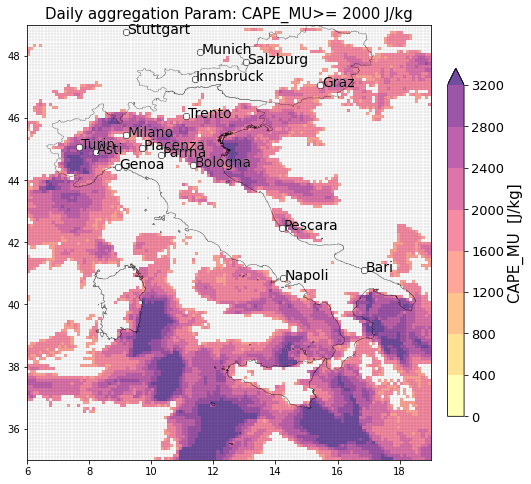

In [19]:
fig, ax = plt.subplots(figsize = (12,8))

if (x_lim != None) & (y_lim != None):     
    plt.xlim(x_lim)
    plt.ylim(y_lim)

#grid shapefile
sf_sp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.1, linestyle='--', zorder=2)

#geographic shapefiles
sf_geo[0].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #ita shapefile
if len(sf_geo) > 1:
    sf_geo[1].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #other shapefile


#plot geodataframe of SPHERA data with color_ton as colorcoding
gdf_CAPE2000.plot(ax=ax, color=gdf_CAPE2000['color'])

#add colorbar
cmap_sp_par = matplotlib.colors.ListedColormap(sns.color_palette(colors).as_hex())
norm = matplotlib.colors.BoundaryNorm(bins, cmap_sp_par.N, extend=cbar_ext)

img = plt.imshow([bins], cmap=cmap_sp_par, norm=norm)
img.set_visible(False)

cb_sp_par=plt.colorbar(orientation='vertical', spacing='proportional', norm=norm,  pad=0.025, shrink=0.8);
cb_sp_par.ax.set_yticklabels(bins, fontsize=13)
cb_sp_par.ax.set_ylabel(f'{sp_par}  {un_meas}', fontsize=15);


#Plot locations and labels of selected cities
for k in range(len(clonsel)):  
    pl.plot(clonsel[k],clatsel[k],'ko',markersize=6)
    pl.plot(clonsel[k],clatsel[k],'wo',markersize=5)
    pl.text(clonsel[k]+.055,clatsel[k]-.055, cnamesel[k],color='w',size=14)
    pl.text(clonsel[k]+.05,clatsel[k]-.05, cnamesel[k],size=14)

if hourly == True:
    title = str(df_sp_Hsel.datetime[0]) + " Param: " + sp_par
else:
    title = 'Daily aggregation' + " Param: " + sp_par + ">= 2000 J/kg"

#pl.grid(ls=(0,(5,5)))
pl.title(label=title, fontsize=15);

### - Some GEODATAFRAME tools:

In [41]:
#access area of every polygon of the geometry (in our case all equal areas as a regular gridded file is used):
gdf_sp_sel.area

0        0.01
1        0.01
2        0.01
3        0.01
4        0.01
         ... 
18110    0.01
18111    0.01
18112    0.01
18113    0.01
18114    0.01
Length: 18115, dtype: float64

In [42]:
#access the boundaries of each polygon of the geometry
gdf_sp_sel.boundary

0        LINESTRING (6.00000 35.00000, 6.00000 35.10000...
1        LINESTRING (6.10000 35.00000, 6.10000 35.10000...
2        LINESTRING (6.20000 35.00000, 6.20000 35.10000...
3        LINESTRING (6.30000 35.00000, 6.30000 35.10000...
4        LINESTRING (6.40000 35.00000, 6.40000 35.10000...
                               ...                        
18110    LINESTRING (10.00000 48.90000, 10.00000 49.000...
18111    LINESTRING (10.10000 48.90000, 10.10000 49.000...
18112    LINESTRING (10.20000 48.90000, 10.20000 49.000...
18113    LINESTRING (10.30000 48.90000, 10.30000 49.000...
18114    LINESTRING (10.40000 48.90000, 10.40000 49.000...
Length: 18115, dtype: geometry

This means that the box_id=0 refers to the low-left corner while box_id=18150 to the upper-right corner of the 10km grid considered (it actually stops at box_id=18114 because the rotation of the grid does not allow to completely fill the uppermost grid line and it stops around 10°E instead of 19°E)

In [43]:
#access the centroids of each polygon of the geometry
gdf_sp_sel.centroid

0         POINT (6.05000 35.05000)
1         POINT (6.15000 35.05000)
2         POINT (6.25000 35.05000)
3         POINT (6.35000 35.05000)
4         POINT (6.45000 35.05000)
                   ...            
18110    POINT (10.05000 48.95000)
18111    POINT (10.15000 48.95000)
18112    POINT (10.25000 48.95000)
18113    POINT (10.35000 48.95000)
18114    POINT (10.45000 48.95000)
Length: 18115, dtype: geometry

In [44]:
#measure distance of each centroid from the first centroid location:
first_point = gdf_sp_sel.centroid.iloc[0]
gdf_sp_sel.centroid.distance(first_point)

0         0.000000
1         0.100000
2         0.200000
3         0.300000
4         0.400000
           ...    
18110    14.464093
18111    14.492067
18112    14.520675
18113    14.549914
18114    14.579781
Length: 18115, dtype: float64

In [45]:
#interactively explore the geodataframe:
gdf_sp_sel.explore("CAPE_MU", legend=False)

## - Create a unique dataset of SPHERA (2016-2018, Apr-Oct) and extract subset over ESWD data

<span style="color:red"> **MISSING DATA IN GRIDDED SPHERA DATASET**: 

**2016**
    
    - 2016-07-19 (from 11 to 23) and 2016-07-20 (00)
    and so ESWD report in gdf_eswd_2016:
    - 316 	2016-07-20 16:15:00 	45.767 	15.067 	NaN 	QC1 	POINT (15.06700 45.76700)
</span>

<span style="color:red"> **MISSING DATA BECAUSE ESWD REPORT TOO CLOSE TO SPHERA GRID BORDER**:
    
**in gdf_eswd_2016:** 
    
    - 128 	2016-05-28 13:05:00 	48.974 	14.474 	3.0 	QC2 	POINT (14.47400 48.97400)
    - 327 	2016-07-21 19:00:00 	48.933 	15.200 	2.0 	QC0+ 	POINT (15.20000 48.93300)
    - 328 	2016-07-21 19:15:00 	48.917 	15.267 	2.0 	QC0+ 	POINT (15.26700 48.91700)
    - 330 	2016-07-21 19:25:00 	48.917 	15.300 	2.0 	QC0+ 	POINT (15.30000 48.91700)
    
**in gdf_eswd_2017:**
    
    - 70 	2017-05-23 13:40:00 	48.869 	17.257 	2.0 	QC1 	POINT (17.25700 48.86900)
    - 195 	2017-07-05 16:50:00 	48.974 	14.474 	2.0 	QC0+ 	POINT (14.47400 48.97400)
    - 446 	2017-08-27 12:45:00 	48.988 	14.442 	3.0 	QC0+ 	POINT (14.44200 48.98800)
    - 447 	2017-08-27 12:45:00 	48.974 	14.474 	3.0 	QC1 	POINT (14.47400 48.97400)
    
**in gdf_eswd_2018:**
    
    - 12 	2018-04-29 17:00:00 	48.800 	18.483 	3.0 	QC1 	POINT (18.48300 48.80000)

In [101]:
gdf_eswd_2018.loc[11:13]

,datetime,lat,lon,size,QC_level,geometry
11,2018-04-29 15:45:00,47.367,18.683,2.0,QC1,POINT (18.68300 47.36700)
12,2018-04-29 17:00:00,48.800,18.483,3.0,QC1,POINT (18.48300 48.80000)
13,2018-04-29 17:00:00,47.200,6.167,3.0,QC1,POINT (6.16700 47.20000)


#dictionary to contain dataframes of daily SPHERA data only considering ESWD days:
sp_eswd1 = dict()

for eswd_day in eswd_ev_sel[eswd_ev_sel.datetime.dt.year <=2016].datetime.dt.date.unique():
    
    #condition if data are missing (do it separately later):
    if eswd_day == datetime.date(2016,7,20):
        print(f'Skipped {eswd_day} !')
        continue
    
    print(eswd_day)
    sp_eswd1[eswd_day] = HF.HF_reanProxies_read(eswd_day.year, eswd_day.month, eswd_day.day)


#write dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2016.txt', 'wb') as file:
     pickle.dump(sp_eswd1,file) # use `json.loads` to do the reverse

#dictionary to contain dataframes of daily SPHERA data only considering ESWD days:
sp_eswd2 = dict()

for eswd_day in eswd_ev_sel[eswd_ev_sel.datetime.dt.year == 2017].datetime.dt.date.unique():
    
    #condition if data are missing (do it separately later):
    if eswd_day == datetime.date(2016,7,20):
        print(f'Skipped {eswd_day} !')
        continue
    
    print(eswd_day)
    sp_eswd2[eswd_day] = HF.HF_reanProxies_read(eswd_day.year, eswd_day.month, eswd_day.day)


#write dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2017.txt', 'wb') as file:
     pickle.dump(sp_eswd2,file)

#dictionary to contain dataframes of daily SPHERA data only considering ESWD days:
sp_eswd3 = dict()

for eswd_day in eswd_ev_sel[eswd_ev_sel.datetime.dt.year == 2018].datetime.dt.date.unique():
    
    #condition if data are missing (do it separately later):
    if eswd_day == datetime.date(2016,7,20):
        print(f'Skipped {eswd_day} !')
        continue
    
    print(eswd_day)
    sp_eswd3[eswd_day] = HF.HF_reanProxies_read(eswd_day.year, eswd_day.month, eswd_day.day)

#write dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2018.txt', 'wb') as file:
     pickle.dump(sp_eswd3,file)

### - Upload SPHERA data over ESWD days:

In [7]:
#read dictionaries from external file
"""
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2016.txt', "rb") as file:  
     sp_eswd_2016 = pickle.load(file)

with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2017.txt', "rb") as file:  
     sp_eswd_2017 = pickle.load(file)
"""
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2018.txt', "rb") as file:  
     sp_eswd_2018 = pickle.load(file)


In [8]:
#convert eswd dataframe to geodataframe with geometry given by lat,lon couples:
gdf_eswd_ev_sel = gpd.GeoDataFrame(eswd_ev_sel, geometry=gpd.points_from_xy(eswd_ev_sel.lon, eswd_ev_sel.lat))
gdf_eswd_ev_sel

,datetime,lat,lon,size,QC_level,geometry
0,2016-04-06 15:55:00,46.993,13.150,NaN,QC0+,POINT (13.15000 46.99300)
1,2016-04-07 06:30:00,45.815,9.571,NaN,QC1,POINT (9.57100 45.81500)
2,2016-04-07 19:20:00,46.167,8.800,2.0,QC1,POINT (8.80000 46.16700)
3,2016-04-08 04:05:00,48.350,17.567,2.0,QC0+,POINT (17.56700 48.35000)
4,2016-04-08 14:30:00,45.117,7.308,NaN,QC1,POINT (7.30800 45.11700)
...,...,...,...,...,...,...
1391,2018-10-01 15:30:00,43.433,6.733,NaN,QC0+,POINT (6.73300 43.43300)
1392,2018-10-07 12:00:00,40.158,18.292,NaN,QC0+,POINT (18.29200 40.15800)
1393,2018-10-21 16:00:00,42.142,12.541,3.0,QC0+,POINT (12.54100 42.14200)
1394,2018-10-21 18:00:00,41.888,12.565,NaN,QC0+,POINT (12.56500 41.88800)


In [9]:
#eswd data over different years:
gdf_eswd_2016 = gdf_eswd_ev_sel[gdf_eswd_ev_sel.datetime.dt.year == 2016]
gdf_eswd_2017 = gdf_eswd_ev_sel[gdf_eswd_ev_sel.datetime.dt.year == 2017].reset_index(drop=True)
gdf_eswd_2018 = gdf_eswd_ev_sel[gdf_eswd_ev_sel.datetime.dt.year == 2018].reset_index(drop=True)
gdf_eswd_2018

,datetime,lat,lon,size,QC_level,geometry
0,2018-04-12 12:45:00,45.184,9.161,2.0,QC1,POINT (9.16100 45.18400)
1,2018-04-12 14:15:00,45.001,9.402,2.0,QC1,POINT (9.40200 45.00100)
2,2018-04-12 14:15:00,44.947,9.405,2.0,QC1,POINT (9.40500 44.94700)
3,2018-04-12 14:15:00,45.058,9.433,2.0,QC1,POINT (9.43300 45.05800)
4,2018-04-12 14:15:00,45.014,9.443,2.0,QC1,POINT (9.44300 45.01400)
...,...,...,...,...,...,...
474,2018-10-01 15:30:00,43.433,6.733,NaN,QC0+,POINT (6.73300 43.43300)
475,2018-10-07 12:00:00,40.158,18.292,NaN,QC0+,POINT (18.29200 40.15800)
476,2018-10-21 16:00:00,42.142,12.541,3.0,QC0+,POINT (12.54100 42.14200)
477,2018-10-21 18:00:00,41.888,12.565,NaN,QC0+,POINT (12.56500 41.88800)


### - Temporal aggregation over the last 3 hours before ESWD event

Before it was around 4 hours!

In [10]:
year = 2018

#dictionary to contain SPHERA geodataframes of 3h aggregations around every hour of ESWD events:
dgdf_sp_3ESWDh_2018 = dict()

if year == 2016:
    gdf_eswd = gdf_eswd_2016
    sp_eswd = sp_eswd_2016

if year == 2017:
    gdf_eswd = gdf_eswd_2017
    sp_eswd = sp_eswd_2017

if year == 2018:
    gdf_eswd = gdf_eswd_2018
    sp_eswd = sp_eswd_2018

for ind in gdf_eswd.index:
    
    print(ind)
    
    #2016
    if year == 2016:
        #condition for the missing day of sphera data (20/7/2016)
        if gdf_eswd.loc[ind].datetime.date() == datetime.date(2016, 7, 20):
            dgdf_sp_3ESWDh_2016[ind] = gpd.GeoDataFrame()
            continue
    
    #2018
    if year == 2018:
    #condition for the cases with eswd hour >= 23.30 utc ( 2018-06-04 23:40:00 and 2018-06-04 23:44:00):
        if (ind == 183) or (ind == 184):

            gdf_eswd_1rep = gdf_eswd.loc[ind]
            
            #select dataframe of SPHERA with the same day of the eswd event (and of the day before if needed):
            df_sp_eswd =  sp_eswd[gdf_eswd_1rep.datetime.date()+ timedelta(days=1)]

            df_sp_eswd_Dbefore = sp_eswd[gdf_eswd_1rep.datetime.date()]

            #find timing of ESWD occurrence (round to hour every 30 mins)
            eswd_hour = (gdf_eswd_1rep.datetime.replace(second=0, microsecond=0, minute=0, hour=gdf_eswd_1rep.datetime.hour) 
                         +timedelta(hours=gdf_eswd_1rep.datetime.minute//30)).hour

            #condition if all the 3hours fall within the OT day of the event:
            if eswd_hour >= 2:

                #select the last 3 hours from SPHERA daily dataset
                df_sp_3ESWDh = df_sp_eswd.loc[(df_sp_eswd.datetime.dt.hour > (int(eswd_hour) - 3)) & 
                                              (df_sp_eswd.datetime.dt.hour <= int(eswd_hour))].reset_index(drop=True)

            #condition if the 3hours are straddling 2 days:
            elif eswd_hour <=1:
                df_sp_3ESWDh = df_sp_eswd.loc[(df_sp_eswd.datetime.dt.hour > (int(eswd_hour) - 3)) & 
                                       (df_sp_eswd.datetime.dt.hour <= int(eswd_hour))].reset_index(drop=True)

                df_sp_3ESWDh_Dbefore = df_sp_eswd_Dbefore.loc[(df_sp_eswd_Dbefore.datetime.dt.hour 
                                                               >= 22+eswd_hour)].reset_index(drop=True)

                df_sp_3ESWDh = pd.concat([df_sp_3ESWDh_Dbefore, df_sp_3ESWDh]).reset_index(drop=True)

            #build sphera geodataframe containing temporal aggregation over the last 3 hours (max/min depending on param):
            gdf_sp_3ESWDh = gpd.GeoDataFrame(columns=['datetime_agg','box_id','%VV700','Kindex','LI','DLS','H0',
                                                   'CAPE_MU','CAPE_ML','geometry'])

            gdf_sp_3ESWDh['box_id'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).max()['box_id']
            gdf_sp_3ESWDh['datetime_agg'][:] = df_sp_3ESWDh["datetime"].iloc[-1]  #referring to last hour of aggregation
            gdf_sp_3ESWDh['%VV700'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).max()['%VV700']
            gdf_sp_3ESWDh['Kindex'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).max()['Kindex']
            gdf_sp_3ESWDh['LI'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).min()['LI']
            gdf_sp_3ESWDh['DLS'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).max()['DLS']
            gdf_sp_3ESWDh['H0'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).min()['H0']
            gdf_sp_3ESWDh['CAPE_MU'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).max()['CAPE_MU']
            gdf_sp_3ESWDh['CAPE_ML'] = df_sp_3ESWDh.groupby(['box_id'], as_index=False).max()['CAPE_ML']
            gdf_sp_3ESWDh['geometry'] = sf_sp.loc[sf_sp.index[list(gdf_sp_3ESWDh['box_id'])]].reset_index(drop=True)['geometry']

            dgdf_sp_3ESWDh_2018[ind] = gdf_sp_3ESWDh

            continue
    
    #in the rest of the cases use external function to compute!
    dgdf_sp_3ESWDh_2018[ind] = HF.HF_rean_tAgg_ESWDh(gdf_eswd.loc[ind], sp_eswd, sf_sp)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

### - Spatial window around each ESWD event

PROBLEMA: se coordinate ESWD sono esatte dopo il decimo di grado (e.g. 15.4, 46.7) o anche solo una delle due coordinate, il punto non ricade all'interno di nessuna cella perchè è proprio sul bordo delle celle della griglia di SPHERA (credo sia per quello): sottrato 0.00001° in lat o lon quando ciò avviene e riformata la geometry afterwards, implementato!

TEST CODE: to use also for eswd 2017-2018

In [83]:
gdf_eswd_1rep = gdf_eswd_2018.loc[12]
dgdf_sp_4ESWDh_1rep = dgdf_sp_4ESWDh_2018[12]

In [84]:
gdf_eswd_1rep

datetime    2018-04-29 17:00:00
lat                        48.8
lon                      18.483
size                        3.0
QC_level                    QC1
geometry    POINT (18.483 48.8)
Name: 12, dtype: object

In [85]:
#condition if lat/lon has only 1 number after comma (i.e. they are in the border of a SPHERA grid cell):
if len(repr(gdf_eswd_1rep.lon).split('.')[1]) == 1:
    gdf_eswd_1rep['lon'] = gdf_eswd_1rep['lon'] - 0.000001
if len(repr(gdf_eswd_1rep.lat).split('.')[1]) == 1:
     gdf_eswd_1rep['lat'] = gdf_eswd_1rep['lat'] + 0.000001
        
gdf_eswd_1rep['geometry'] = gpd.points_from_xy([gdf_eswd_1rep.lon], [gdf_eswd_1rep.lat])

In [86]:
gdf_eswd_1rep

datetime                   2018-04-29 17:00:00
lat                                  48.800001
lon                                     18.483
size                                       3.0
QC_level                                   QC1
geometry    [POINT (18.483 48.80000099999999)]
Name: 12, dtype: object

FINE TEST CODE

In [11]:
#year = 2016

#dictionary to contain SPHERA geodataframes of 3h aggregations and spatial neighbourhood limited
#around every ESWD event:
dgdf_sp_3ESWDh_nn_2018 = dict()

if year == 2016:
    gdf_eswd = gdf_eswd_2016

if year == 2017:
    gdf_eswd = gdf_eswd_2017

if year == 2018:
    gdf_eswd = gdf_eswd_2018

for ind in gdf_eswd.index:
    print(ind)
    
    #conditions for the missing day of sphera data (20/7/2016) and for eswd reports too close to sphera border:
     
    #2016: 
    #if (ind == 316) or (ind == 128) or (ind == 327) or (ind == 328) or (ind == 330):

    #2017: 
    #if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):   
    
    #2018
    if ind ==12:
    
        dgdf_sp_3ESWDh_nn_2018[ind] = gpd.GeoDataFrame()
        continue    

    dgdf_sp_3ESWDh_nn_2018[ind] = HF.HF_rean_spatWindowESWD(gdf_eswd.loc[ind], dgdf_sp_3ESWDh_2018[ind])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [21]:
gdf_eswd_2016.loc[ind]

datetime      2016-05-28 13:05:00
lat                        48.974
lon                        14.474
size                          3.0
QC_level                      QC2
geometry    POINT (14.474 48.974)
Name: 128, dtype: object

### - Write processed datasets in external files

In [12]:
#write dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2018_Aggr3h-nn.txt', 'wb') as file:
     pickle.dump(dgdf_sp_3ESWDh_nn_2018,file)

### - Read processed datasets from external files

In [13]:
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2018_Aggr3h-nn.txt', 'rb') as file:
     dgdf_sp_3ESWDh_nn_2018 = pickle.load(file)

In [14]:
len(gdf_eswd_2018)

479

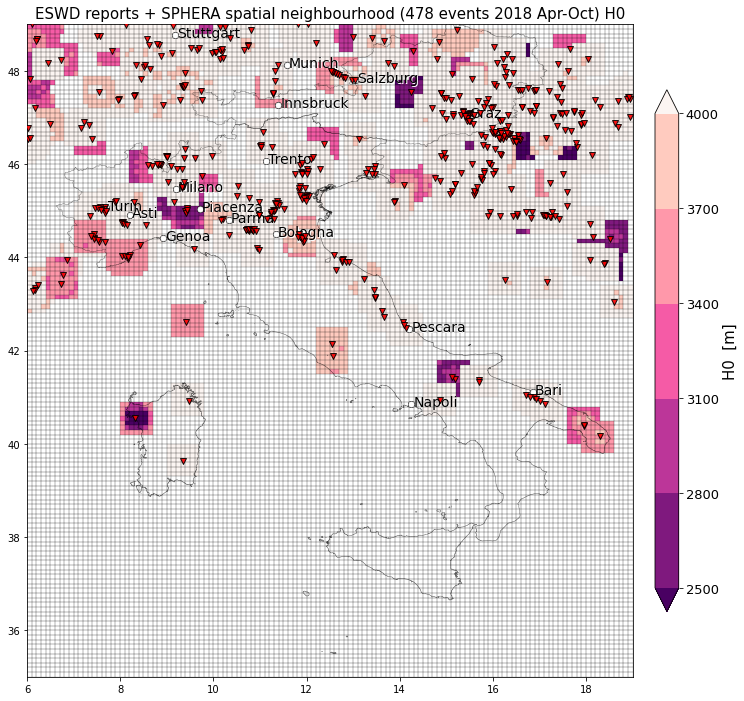

In [15]:
hourly=False

x_limG = [12,17]
y_limG = [46,49]

fig, ax = plt.subplots(figsize = (16,12))

if (x_lim != None) & (y_lim != None):     
    plt.xlim(x_lim)
    plt.ylim(y_lim)

#grid shapefile
sf_sp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.3, zorder=2)

#geographic shapefiles
sf_geo[0].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #ita shapefile
if len(sf_geo) > 1:
    sf_geo[1].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #other shapefile

sp_par='H0'

#color-code grid cells for a certain parameter:
if sp_par == 'LI':
    col_num = 3
    un_meas = '[°C]'  #unit measure for colorbar label
    cbar_ext = 'max' #extension of the colorbar over defined ranges
elif sp_par == 'Kindex':
    col_num = 4
    cbar_ext = 'both'
    un_meas = '[°C]'
elif sp_par == '%VV700':
    col_num = 5
    cbar_ext = 'neither'
    un_meas = '%'
elif (sp_par == 'CAPE_MU') or (sp_par == 'CAPE_ML'):
    col_num = 6
    cbar_ext = 'max'
    un_meas = '[J/kg]'
elif sp_par == 'H0':
    col_num = 7
    cbar_ext = 'both'
    un_meas = '[m]'
elif sp_par == 'DLS':
    col_num = 8
    cbar_ext = 'both'
    un_meas = '[m/s]'


#calculate colorcoding dependent from the chosen parameter
col_boxes = dgdf_sp_3ESWDh_2018[0].box_id    

#plot geodataframe of SPHERA data with color_ton as colorcoding
for ind in gdf_eswd_2018.index:
    #print(ind)
    
    
        #2016: 
    #if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        #2017: 
    #if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):
        #2018: 
    if (ind == 12):
        continue
    
    color_ton, bins, colors = HF.HF_calc_color(dgdf_sp_3ESWDh_2018[ind][sp_par], color=col_num)
    
    dgdf_sp_3ESWDh_nn_2018[ind][[sp_par,'geometry']].plot(ax=ax, color=color_ton)

    pl.scatter(gdf_eswd_2018.loc[ind].lon,gdf_eswd_2018.loc[ind].lat,35,c='red',
                                marker="v",edgecolor='k',alpha=0.9,zorder=4)

#add colorbar
cmap_sp_par = matplotlib.colors.ListedColormap(sns.color_palette(colors).as_hex())
norm = matplotlib.colors.BoundaryNorm(bins, cmap_sp_par.N, extend=cbar_ext)

img = plt.imshow([bins], cmap=cmap_sp_par, norm=norm)
img.set_visible(False)

cb_sp_par=plt.colorbar(orientation='vertical', spacing='proportional', norm=norm,  pad=0.025, shrink=0.8);
cb_sp_par.ax.set_yticklabels(bins, fontsize=13)
cb_sp_par.ax.set_ylabel(f'{sp_par}  {un_meas}', fontsize=15);



#Plot locations and labels of selected cities
for k in range(len(clonsel)):  
    pl.plot(clonsel[k],clatsel[k],'ko',markersize=6)
    pl.plot(clonsel[k],clatsel[k],'wo',markersize=5)
    pl.text(clonsel[k]+.055,clatsel[k]-.055, cnamesel[k],color='w',size=14)
    pl.text(clonsel[k]+.05,clatsel[k]-.05, cnamesel[k],size=14)

if hourly == True:
    title = str(df_sp_Hsel.datetime[0]) + " Param: " + sp_par
else:
    title = 'ESWD reports + SPHERA spatial neighbourhood (478 events 2018 Apr-Oct) ' + sp_par

#pl.grid(ls=(0,(5,5)))
pl.title(label=title, fontsize=15); 

#plt.savefig(f'/home/ciccuz/phd/KIT/scripts/plots/eswd+spheraSpatNeigh_2016_{sp_par}.png', dpi=300, bbox_inches='tight')
#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/eswd+spheraSpatNeigh_2017_CAPE.png', dpi=300, bbox_inches='tight')
#

# Construct ESWD-based SPHERA params distribution over whole domain:

#### - Extract from each reanalysis parameter the max/min  in every neighbourhood and build a unique data distribution

box_id and geometry of the cells are not retained (as they will not be used in distribution and also because I had to understand how to extract the center of the 7x7 grid cells...dont needed)

In [8]:
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2016_Aggr3h-nn.txt', 'rb') as file:
     dgdf_sp_3ESWDh_nn_2016 = pickle.load(file)
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2017_Aggr3h-nn.txt', 'rb') as file:
     dgdf_sp_3ESWDh_nn_2017 = pickle.load(file)
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2018_Aggr3h-nn.txt', 'rb') as file:
     dgdf_sp_3ESWDh_nn_2018 = pickle.load(file)

In [9]:
#perform spatial aggregation
gdf_sp_3ESWDh_nn_Aggr_2016 = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016[0].columns)

for ind in dgdf_sp_3ESWDh_nn_2016.keys():
        
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016 = gdf_sp_3ESWDh_nn_Aggr_2016.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2016 = gdf_sp_3ESWDh_nn_Aggr_2016.reset_index(drop=True)

In [10]:
#perform spatial aggregation
gdf_sp_3ESWDh_nn_Aggr_2017 = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2017[0].columns)

for ind in dgdf_sp_3ESWDh_nn_2017.keys():
        
    if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2017[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2017[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2017[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2017 = gdf_sp_3ESWDh_nn_Aggr_2017.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2017 = gdf_sp_3ESWDh_nn_Aggr_2017.reset_index(drop=True)

In [11]:
#perform spatial aggregation
gdf_sp_3ESWDh_nn_Aggr_2018 = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2018[0].columns)

for ind in dgdf_sp_3ESWDh_nn_2018.keys():
        
    if (ind == 12):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2018[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2018[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2018[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2018 = gdf_sp_3ESWDh_nn_Aggr_2018.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2018 = gdf_sp_3ESWDh_nn_Aggr_2018.reset_index(drop=True)

In [12]:
#concat 3 years together
gdf_sp_3ESWDh_nn_Aggr_2016_2018 = pd.concat([gdf_sp_3ESWDh_nn_Aggr_2016,gdf_sp_3ESWDh_nn_Aggr_2017,
                                                                    gdf_sp_3ESWDh_nn_Aggr_2018]).reset_index(drop=True)

In [13]:
gdf_sp_3ESWDh_nn_Aggr_2016_2018

,datetime_agg,box_id,%VV700,Kindex,LI,DLS,H0,CAPE_MU,CAPE_ML,geometry
0,2016-04-06 16:00:00,NaN,100.000000,33.604656,-2.085889,15.847551,2270.31250,286.437500,136.796875,None
1,2016-04-07 07:00:00,NaN,100.000000,34.590282,-3.178591,16.753138,2273.96240,852.985413,698.171082,None
2,2016-04-07 19:00:00,NaN,100.000000,35.327213,-3.433281,20.842634,2037.95837,686.085388,592.406250,None
3,2016-04-08 04:00:00,NaN,93.333336,30.302052,7.663734,18.190380,2481.96094,174.648438,0.137500,None
4,2016-04-08 15:00:00,NaN,100.000000,33.303299,-3.408240,19.644154,1853.66663,730.421082,510.501556,None
...,...,...,...,...,...,...,...,...,...,...
1381,2018-10-01 16:00:00,NaN,100.000000,37.654751,-7.456228,20.643147,2274.83740,1413.664060,1221.148440,None
1382,2018-10-07 12:00:00,NaN,100.000000,36.392201,-8.148877,17.729191,3129.00000,2639.171140,2339.763180,None
1383,2018-10-21 16:00:00,NaN,95.000000,34.386688,-4.831861,28.530981,2362.52490,1075.068730,975.303101,None
1384,2018-10-21 18:00:00,NaN,100.000000,34.906002,-5.122384,30.147285,2378.63184,1231.679200,1110.431270,None


#### - Redo the same process when considering only ESWD reports with hail >=3cm

In [14]:
#select eswd data over different years with hailsize >=3cm:
gdf_eswd_2016_3cm = gdf_eswd_2016[gdf_eswd_2016['size']>=3]
gdf_eswd_2017_3cm = gdf_eswd_2017[gdf_eswd_2017['size']>=3]
gdf_eswd_2018_3cm = gdf_eswd_2018[gdf_eswd_2018['size']>=3]
gdf_eswd_2016_3cm

,datetime,lat,lon,size,QC_level,geometry
10,2016-04-14 10:00:00,44.226,18.691,3.0,QC1,POINT (18.69100 44.22600)
25,2016-05-10 17:10:00,47.292,7.185,3.0,QC1,POINT (7.18500 47.29200)
68,2016-05-19 14:00:00,43.354,12.572,3.0,QC1,POINT (12.57200 43.35400)
87,2016-05-27 13:00:00,48.383,15.183,3.0,QC0+,POINT (15.18300 48.38300)
88,2016-05-27 13:00:00,48.592,14.750,5.0,QC0+,POINT (14.75000 48.59200)
...,...,...,...,...,...,...
428,2016-09-04 15:20:00,46.833,15.500,3.0,QC1,POINT (15.50000 46.83300)
430,2016-09-04 15:22:00,46.854,15.538,3.0,QC1,POINT (15.53800 46.85400)
431,2016-09-04 15:25:00,46.862,15.524,3.5,QC0+,POINT (15.52400 46.86200)
434,2016-09-14 19:30:00,36.365,6.615,4.0,QC1,POINT (6.61500 36.36500)


In [15]:
#select subset presentin eswd event >=3cm:
dgdf_sp_3ESWDh_nn_2016_3cm = {key: dgdf_sp_3ESWDh_nn_2016[key] for key in gdf_eswd_2016_3cm.index}
dgdf_sp_3ESWDh_nn_2017_3cm = {key: dgdf_sp_3ESWDh_nn_2017[key] for key in gdf_eswd_2017_3cm.index}
dgdf_sp_3ESWDh_nn_2018_3cm = {key: dgdf_sp_3ESWDh_nn_2018[key] for key in gdf_eswd_2018_3cm.index}

"""
dgdf_sp_4ESWDh_nn_2016_3cm = dict()
for key in dgdf_sp_4ESWDh_nn_2016.keys():
    if key in gdf_eswd_2016_3cm.index:
        dgdf_sp_4ESWDh_nn_2016_3cm[key] = dgdf_sp_4ESWDh_nn_2016[key]
        
dgdf_sp_4ESWDh_nn_2017_3cm = dict()
for key in dgdf_sp_4ESWDh_nn_2017.keys():
    if key in gdf_eswd_2017_3cm.index:
        dgdf_sp_4ESWDh_nn_2017_3cm[key] = dgdf_sp_4ESWDh_nn_2017[key]
    
dgdf_sp_4ESWDh_nn_2018_3cm = dict()
for key in dgdf_sp_4ESWDh_nn_2018.keys():
    if key in gdf_eswd_2018_3cm.index:
        dgdf_sp_4ESWDh_nn_2018_3cm[key] = dgdf_sp_4ESWDh_nn_2018[key]
"""

'\ndgdf_sp_4ESWDh_nn_2016_3cm = dict()\nfor key in dgdf_sp_4ESWDh_nn_2016.keys():\n    if key in gdf_eswd_2016_3cm.index:\n        dgdf_sp_4ESWDh_nn_2016_3cm[key] = dgdf_sp_4ESWDh_nn_2016[key]\n        \ndgdf_sp_4ESWDh_nn_2017_3cm = dict()\nfor key in dgdf_sp_4ESWDh_nn_2017.keys():\n    if key in gdf_eswd_2017_3cm.index:\n        dgdf_sp_4ESWDh_nn_2017_3cm[key] = dgdf_sp_4ESWDh_nn_2017[key]\n    \ndgdf_sp_4ESWDh_nn_2018_3cm = dict()\nfor key in dgdf_sp_4ESWDh_nn_2018.keys():\n    if key in gdf_eswd_2018_3cm.index:\n        dgdf_sp_4ESWDh_nn_2018_3cm[key] = dgdf_sp_4ESWDh_nn_2018[key]\n'

In [16]:
#aggregate the results by extracting max/min param in every neighbourhood considered:
gdf_sp_3ESWDh_nn_Aggr_2016_3cm = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_3cm[10].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_3cm.keys():
        
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_3cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_3cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_3cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_3cm = gdf_sp_3ESWDh_nn_Aggr_2016_3cm.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2016_3cm = gdf_sp_3ESWDh_nn_Aggr_2016_3cm.reset_index(drop=True)

In [17]:
gdf_sp_3ESWDh_nn_Aggr_2017_3cm = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_3cm[10].columns)

for ind in dgdf_sp_3ESWDh_nn_2017_3cm.keys():
        
    if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2017_3cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2017_3cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2017_3cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2017_3cm = gdf_sp_3ESWDh_nn_Aggr_2017_3cm.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2017_3cm = gdf_sp_3ESWDh_nn_Aggr_2017_3cm.reset_index(drop=True)

In [18]:
gdf_sp_3ESWDh_nn_Aggr_2018_3cm = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_3cm[10].columns)

for ind in dgdf_sp_3ESWDh_nn_2018_3cm.keys():
        
    if (ind == 12):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2018_3cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2018_3cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2018_3cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2018_3cm = gdf_sp_3ESWDh_nn_Aggr_2018_3cm.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2018_3cm = gdf_sp_3ESWDh_nn_Aggr_2018_3cm.reset_index(drop=True)

In [19]:
#concat 3 years together
gdf_sp_3ESWDh_nn_Aggr_2016_2018_3cm = pd.concat([gdf_sp_3ESWDh_nn_Aggr_2016_3cm,gdf_sp_3ESWDh_nn_Aggr_2017_3cm,
                                                                    gdf_sp_3ESWDh_nn_Aggr_2018_3cm]).reset_index(drop=True)

#### - Redo the same process when considering only ESWD reports with hail >=5cm

In [20]:
#select eswd data over different years with hailsize >=3cm:
gdf_eswd_2016_5cm = gdf_eswd_2016[gdf_eswd_2016['size']>=5]
gdf_eswd_2017_5cm = gdf_eswd_2017[gdf_eswd_2017['size']>=5]
gdf_eswd_2018_5cm = gdf_eswd_2018[gdf_eswd_2018['size']>=5]
gdf_eswd_2016_5cm

,datetime,lat,lon,size,QC_level,geometry
88,2016-05-27 13:00:00,48.592,14.750,5.0,QC0+,POINT (14.75000 48.59200)
91,2016-05-27 13:55:00,48.686,14.577,5.0,QC2,POINT (14.57700 48.68600)
92,2016-05-27 14:00:00,48.650,14.550,5.0,QC1,POINT (14.55000 48.65000)
96,2016-05-27 14:30:00,48.583,14.750,5.0,QC0+,POINT (14.75000 48.58300)
100,2016-05-27 14:45:00,48.517,14.800,5.0,QC0+,POINT (14.80000 48.51700)
...,...,...,...,...,...,...
412,2016-08-21 15:45:00,44.964,15.998,6.0,QC1,POINT (15.99800 44.96400)
414,2016-08-21 15:45:00,44.958,16.008,6.0,QC1,POINT (16.00800 44.95800)
415,2016-08-21 15:50:00,44.946,16.079,7.5,QC1,POINT (16.07900 44.94600)
424,2016-08-29 20:10:00,45.077,7.675,5.0,QC1,POINT (7.67500 45.07700)


In [21]:
#select sphera subset present in eswd event >=3cm:

dgdf_sp_3ESWDh_nn_2016_5cm = {key: dgdf_sp_3ESWDh_nn_2016[key] for key in gdf_eswd_2016_5cm.index}
dgdf_sp_3ESWDh_nn_2017_5cm = {key: dgdf_sp_3ESWDh_nn_2017[key] for key in gdf_eswd_2017_5cm.index}
dgdf_sp_3ESWDh_nn_2018_5cm = {key: dgdf_sp_3ESWDh_nn_2018[key] for key in gdf_eswd_2018_5cm.index}

"""
dgdf_sp_4ESWDh_nn_2016_5cm = dict()
for key in dgdf_sp_4ESWDh_nn_2016.keys():
    if key in gdf_eswd_2016_5cm.index:
        dgdf_sp_4ESWDh_nn_2016_5cm[key] = dgdf_sp_4ESWDh_nn_2016[key]
        
dgdf_sp_4ESWDh_nn_2017_5cm = dict()
for key in dgdf_sp_4ESWDh_nn_2017.keys():
    if key in gdf_eswd_2017_5cm.index:
        dgdf_sp_4ESWDh_nn_2017_5cm[key] = dgdf_sp_4ESWDh_nn_2017[key]
    
dgdf_sp_4ESWDh_nn_2018_5cm = dict()
for key in dgdf_sp_4ESWDh_nn_2018.keys():
    if key in gdf_eswd_2018_5cm.index:
        dgdf_sp_4ESWDh_nn_2018_5cm[key] = dgdf_sp_4ESWDh_nn_2018[key]
"""

'\ndgdf_sp_4ESWDh_nn_2016_5cm = dict()\nfor key in dgdf_sp_4ESWDh_nn_2016.keys():\n    if key in gdf_eswd_2016_5cm.index:\n        dgdf_sp_4ESWDh_nn_2016_5cm[key] = dgdf_sp_4ESWDh_nn_2016[key]\n        \ndgdf_sp_4ESWDh_nn_2017_5cm = dict()\nfor key in dgdf_sp_4ESWDh_nn_2017.keys():\n    if key in gdf_eswd_2017_5cm.index:\n        dgdf_sp_4ESWDh_nn_2017_5cm[key] = dgdf_sp_4ESWDh_nn_2017[key]\n    \ndgdf_sp_4ESWDh_nn_2018_5cm = dict()\nfor key in dgdf_sp_4ESWDh_nn_2018.keys():\n    if key in gdf_eswd_2018_5cm.index:\n        dgdf_sp_4ESWDh_nn_2018_5cm[key] = dgdf_sp_4ESWDh_nn_2018[key]\n'

In [22]:
#aggregate the results by extracting max/min param in every neighbourhood considered:
gdf_sp_3ESWDh_nn_Aggr_2016_5cm = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_5cm[88].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_5cm.keys():
        
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_5cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_5cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_5cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_5cm = gdf_sp_3ESWDh_nn_Aggr_2016_5cm.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2016_5cm = gdf_sp_3ESWDh_nn_Aggr_2016_5cm.reset_index(drop=True)

In [23]:
gdf_sp_3ESWDh_nn_Aggr_2017_5cm = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_5cm[88].columns)

for ind in dgdf_sp_3ESWDh_nn_2017_5cm.keys():
        
    if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2017_5cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2017_5cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2017_5cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2017_5cm = gdf_sp_3ESWDh_nn_Aggr_2017_5cm.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2017_5cm = gdf_sp_3ESWDh_nn_Aggr_2017_5cm.reset_index(drop=True)

In [24]:
gdf_sp_3ESWDh_nn_Aggr_2018_5cm = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_5cm[88].columns)

for ind in dgdf_sp_3ESWDh_nn_2018_5cm.keys():
        
    if (ind == 12):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2018_5cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2018_5cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2018_5cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2018_5cm = gdf_sp_3ESWDh_nn_Aggr_2018_5cm.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2018_5cm = gdf_sp_3ESWDh_nn_Aggr_2018_5cm.reset_index(drop=True)

In [25]:
#concat 3 years together
gdf_sp_3ESWDh_nn_Aggr_2016_2018_5cm = pd.concat([gdf_sp_3ESWDh_nn_Aggr_2016_5cm,gdf_sp_3ESWDh_nn_Aggr_2017_5cm,
                                                                    gdf_sp_3ESWDh_nn_Aggr_2018_5cm]).reset_index(drop=True)

In [26]:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_5cm

,datetime_agg,box_id,%VV700,Kindex,LI,DLS,H0,CAPE_MU,CAPE_ML,geometry
0,2016-05-27 13:00:00,NaN,100.000000,36.210075,-4.522205,23.625778,3188.89844,1309.89844,937.312500,None
1,2016-05-27 14:00:00,NaN,86.666664,36.210075,-4.159058,23.625778,3234.34155,1110.73328,713.979187,None
2,2016-05-27 14:00:00,NaN,86.666664,36.210075,-4.159058,23.625778,3234.34155,1110.73328,713.979187,None
3,2016-05-27 15:00:00,NaN,100.000000,36.210075,-4.938169,23.625778,3285.42505,1330.16406,937.312500,None
4,2016-05-27 15:00:00,NaN,100.000000,36.210075,-4.938169,23.625778,3285.42505,1330.16406,937.312500,None
...,...,...,...,...,...,...,...,...,...,...
170,2018-09-02 15:00:00,NaN,100.000000,38.809120,-6.035421,27.217350,3170.69531,2034.07349,1689.139650,None
171,2018-09-07 13:00:00,NaN,80.000000,39.025948,-6.010187,17.177467,3447.89990,2114.56665,1881.333370,None
172,2018-09-07 14:00:00,NaN,100.000000,38.057068,-6.294042,27.611408,3487.45630,2417.25659,1976.769780,None
173,2018-09-07 15:00:00,NaN,100.000000,38.952545,-6.294042,27.611408,3487.45630,1928.86108,1566.507320,None


#### - Redo the same process when considering ESWD reports with small hail: <3cm (but with hail size!)

In [27]:
#select eswd data over different years with hailsize >=3cm:
gdf_eswd_2016_small = gdf_eswd_2016[gdf_eswd_2016['size']<3]
gdf_eswd_2017_small = gdf_eswd_2017[gdf_eswd_2017['size']<3]
gdf_eswd_2018_small = gdf_eswd_2018[gdf_eswd_2018['size']<3]
gdf_eswd_2016_small

,datetime,lat,lon,size,QC_level,geometry
2,2016-04-07 19:20:00,46.167,8.800,2.0,QC1,POINT (8.80000 46.16700)
3,2016-04-08 04:05:00,48.350,17.567,2.0,QC0+,POINT (17.56700 48.35000)
5,2016-04-12 12:55:00,48.822,9.307,2.0,QC0+,POINT (9.30700 48.82200)
7,2016-04-12 13:56:00,48.867,10.017,2.0,QC1,POINT (10.01700 48.86700)
13,2016-05-03 13:17:00,47.467,18.817,2.0,QC1,POINT (18.81700 47.46700)
...,...,...,...,...,...,...
422,2016-08-29 13:25:00,46.901,15.528,2.0,QC1,POINT (15.52800 46.90100)
423,2016-08-29 13:56:00,46.826,15.598,2.5,QC0+,POINT (15.59800 46.82600)
425,2016-09-01 15:28:00,48.183,13.750,2.5,QC0+,POINT (13.75000 48.18300)
429,2016-09-04 15:21:00,46.942,15.331,2.0,QC0+,POINT (15.33100 46.94200)


In [28]:
#select sphera subset present in eswd event with SMALL hail:

dgdf_sp_3ESWDh_nn_2016_small = {key: dgdf_sp_3ESWDh_nn_2016[key] for key in gdf_eswd_2016_small.index}
dgdf_sp_3ESWDh_nn_2017_small = {key: dgdf_sp_3ESWDh_nn_2017[key] for key in gdf_eswd_2017_small.index}
dgdf_sp_3ESWDh_nn_2018_small = {key: dgdf_sp_3ESWDh_nn_2018[key] for key in gdf_eswd_2018_small.index}

In [29]:
#aggregate the results by extracting max/min param in every neighbourhood considered:
gdf_sp_3ESWDh_nn_Aggr_2016_small = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_small[2].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_small.keys():
        
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_small[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_small[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_small[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_small = gdf_sp_3ESWDh_nn_Aggr_2016_small.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2016_small = gdf_sp_3ESWDh_nn_Aggr_2016_small.reset_index(drop=True)

In [30]:
gdf_sp_3ESWDh_nn_Aggr_2017_small  = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_small[2].columns)

for ind in dgdf_sp_3ESWDh_nn_2017_small.keys():
        
    if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2017_small[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2017_small[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2017_small[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2017_small = gdf_sp_3ESWDh_nn_Aggr_2017_small.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2017_small = gdf_sp_3ESWDh_nn_Aggr_2017_small.reset_index(drop=True)

In [31]:
gdf_sp_3ESWDh_nn_Aggr_2018_small = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_small[2].columns)

for ind in dgdf_sp_3ESWDh_nn_2018_small.keys():
        
    if (ind == 12):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2018_small[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2018_small[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2018_small[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2018_small = gdf_sp_3ESWDh_nn_Aggr_2018_small.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2018_small = gdf_sp_3ESWDh_nn_Aggr_2018_small.reset_index(drop=True)

In [32]:
#concat 3 years together
gdf_sp_3ESWDh_nn_Aggr_2016_2018_small = pd.concat([gdf_sp_3ESWDh_nn_Aggr_2016_small,gdf_sp_3ESWDh_nn_Aggr_2017_small,
                                                                    gdf_sp_3ESWDh_nn_Aggr_2018_small]).reset_index(drop=True)

#### - Cumulative distribution functions of the parameters considering full ESWD, ESWD-3cm+ and ESWD-5cm+:

In [64]:
sp_par = 'DLS'

In [65]:
#parameters for different proxies:
if sp_par == 'LI':
    un_meas = '[°C]'  #unit measure for colorbar label
    percent = 90
elif sp_par == 'Kindex':
    un_meas = '[°C]'
    percent = 10
elif sp_par == '%VV700':
    un_meas = '%'
    percent = 10
elif (sp_par == 'CAPE_MU') or (sp_par == 'CAPE_ML'):
    un_meas = '[J/kg]'
    percent = 10
elif sp_par == 'H0':
    un_meas = '[m]'
    percent = 90
elif sp_par == 'DLS':
    un_meas = '[m/s]'
    percent = 10

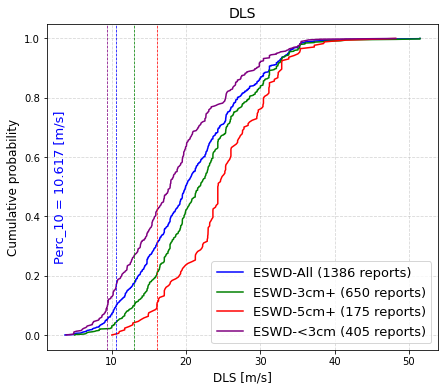

In [66]:
fig, ax = plt.subplots(figsize = (7,6))

data = gdf_sp_3ESWDh_nn_Aggr_2016_2018[sp_par]
data_3cm = gdf_sp_3ESWDh_nn_Aggr_2016_2018_3cm[sp_par]
data_5cm = gdf_sp_3ESWDh_nn_Aggr_2016_2018_5cm[sp_par]
data_small = gdf_sp_3ESWDh_nn_Aggr_2016_2018_small[sp_par]

#sort data
x = np.sort(data)
x_3cm = np.sort(data_3cm)
x_5cm = np.sort(data_5cm)
x_small = np.sort(data_small)

#calculate CDF values
y = 1. * np.arange(len(data)) / (len(data) - 1)
y_3cm = 1. * np.arange(len(data_3cm)) / (len(data_3cm) - 1)
y_5cm = 1. * np.arange(len(data_5cm)) / (len(data_5cm) - 1)
y_small = 1. * np.arange(len(data_small)) / (len(data_small) - 1)

#plot CDF
ax.plot(x, y, color='blue', label='ESWD-All (1386 reports)')
ax.plot(x_3cm, y_3cm, color='green', label='ESWD-3cm+ (650 reports)')
ax.plot(x_5cm, y_5cm, color='red', label='ESWD-5cm+ (175 reports)')
ax.plot(x_small, y_small, color='purple', label='ESWD-<3cm (405 reports)')

ax.set_xlabel(f'{sp_par} ' + f'{un_meas}', fontsize=12)
ax.set_ylabel('Cumulative probability', fontsize=12)
ax.set_title(f'{sp_par}', fontsize=14);

plt.axvline(x=np.percentile(x,percent), lw=0.75, linestyle='--', color='blue')
plt.axvline(x=np.percentile(x_3cm,percent), lw=0.75, linestyle='--', color='green')
plt.axvline(x=np.percentile(x_5cm,percent), lw=0.75, linestyle='--', color='red')
plt.axvline(x=np.percentile(x_small,percent), lw=0.75, linestyle='--', color='purple')

plt.text(np.percentile(x,percent)*(1-0.8), .5, f"Perc_{percent} = {np.percentile(x,percent):.5} {un_meas}", 
         rotation=90, verticalalignment='center', color='blue', fontsize=13)
#plt.text(np.percentile(x_3cm,percent)*(1+0.15), .5, f"Perc_{percent} = {np.percentile(x_3cm,percent):.5} {un_meas}", 
#         rotation=90, verticalalignment='center', color='green', fontsize=13)
#plt.text(np.percentile(x_5cm,percent)*(1+0.05), .5, f"Perc_{percent} = {np.percentile(x_5cm,percent):.5} {un_meas}", 
#         rotation=90, verticalalignment='center', color='red', fontsize=13)
#plt.text(np.percentile(x_small,percent)*(1-0.7), .5, f"Perc_{percent} = {np.percentile(x_small,percent):.5} {un_meas}", 
#         rotation=90, verticalalignment='center', color='purple', fontsize=13)

plt.grid(ls='--', alpha=0.5)
plt.legend(loc='best', fontsize=13)

#plt.savefig(f'/home/ciccuz/phd/KIT/scripts/plots/CDF_distributions/3hFilter/pdfs/CDF_{sp_par}.pdf', 
#            dpi=300, bbox_inches='tight')

## CONSIDER *only ITALY* to see if the distribution of the parameters change very much

IT DOESNT

#subset of eswd reports over Italy for each year
ita_gdf_eswd_2016 = gpd.clip(gdf_eswd_2016, sfg_ita).sort_index(ascending=True) #ita_eswd[ita_eswd.datetime.dt.year == 2016]
ita_gdf_eswd_2017 = gpd.clip(gdf_eswd_2017, sfg_ita).sort_index(ascending=True) #ita_eswd[ita_eswd.datetime.dt.year == 2016]
ita_gdf_eswd_2018 = gpd.clip(gdf_eswd_2018, sfg_ita).sort_index(ascending=True) #ita_eswd[ita_eswd.datetime.dt.year == 2016]

#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2016_Aggr4h-nn.txt', 'rb') as file:
     dgdf_sp_4ESWDh_nn_2016 = pickle.load(file)
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2017_Aggr4h-nn.txt', 'rb') as file:
     dgdf_sp_4ESWDh_nn_2017 = pickle.load(file)
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/SpInd_eswdDays_2018_Aggr4h-nn.txt', 'rb') as file:
     dgdf_sp_4ESWDh_nn_2018 = pickle.load(file)

#select subset of Italian sphera neighbourhoods based on eswd italian reports:
ITA_dgdf_sp_4ESWDh_nn_2016 = {key: dgdf_sp_4ESWDh_nn_2016[key] for key in ita_gdf_eswd_2016.index}
ITA_dgdf_sp_4ESWDh_nn_2017 = {key: dgdf_sp_4ESWDh_nn_2017[key] for key in ita_gdf_eswd_2017.index}
ITA_dgdf_sp_4ESWDh_nn_2018 = {key: dgdf_sp_4ESWDh_nn_2018[key] for key in ita_gdf_eswd_2018.index}

#### - All ESWD reports together over Italy (434 reports)

#perform spatial aggregation
ITA_gdf_sp_4ESWDh_nn_Aggr_2016 = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2016[1].columns)

for ind in ITA_dgdf_sp_4ESWDh_nn_2016.keys():
        
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2016[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = ITA_dgdf_sp_4ESWDh_nn_2016[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = ITA_dgdf_sp_4ESWDh_nn_2016[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    ITA_gdf_sp_4ESWDh_nn_Aggr_2016 = ITA_gdf_sp_4ESWDh_nn_Aggr_2016.append(temp)

ITA_gdf_sp_4ESWDh_nn_Aggr_2016 = ITA_gdf_sp_4ESWDh_nn_Aggr_2016.reset_index(drop=True)

#perform spatial aggregation
ITA_gdf_sp_4ESWDh_nn_Aggr_2017 = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2017[0].columns)

for ind in ITA_dgdf_sp_4ESWDh_nn_2017.keys():
        
    if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2017[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = ITA_dgdf_sp_4ESWDh_nn_2017[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = ITA_dgdf_sp_4ESWDh_nn_2017[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    ITA_gdf_sp_4ESWDh_nn_Aggr_2017 = ITA_gdf_sp_4ESWDh_nn_Aggr_2017.append(temp)

ITA_gdf_sp_4ESWDh_nn_Aggr_2017 = ITA_gdf_sp_4ESWDh_nn_Aggr_2017.reset_index(drop=True)

#perform spatial aggregation
ITA_gdf_sp_4ESWDh_nn_Aggr_2018 = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2018[0].columns)

for ind in ITA_dgdf_sp_4ESWDh_nn_2018.keys():
        
    if (ind == 12):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2018[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = ITA_dgdf_sp_4ESWDh_nn_2018[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = ITA_dgdf_sp_4ESWDh_nn_2018[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    ITA_gdf_sp_4ESWDh_nn_Aggr_2018 = ITA_gdf_sp_4ESWDh_nn_Aggr_2018.append(temp)

ITA_gdf_sp_4ESWDh_nn_Aggr_2018 = ITA_gdf_sp_4ESWDh_nn_Aggr_2018.reset_index(drop=True)

#concat 3 years together
ITA_gdf_sp_4ESWDh_nn_Aggr_2016_2018 = pd.concat([ITA_gdf_sp_4ESWDh_nn_Aggr_2016,ITA_gdf_sp_4ESWDh_nn_Aggr_2017,
                                                                    ITA_gdf_sp_4ESWDh_nn_Aggr_2018]).reset_index(drop=True)

#### - ESWD reports >3cm over Italy (180 reports)

#select eswd data over different years with hailsize >=3cm:
ita_gdf_eswd_2016_3cm = ita_gdf_eswd_2016[ita_gdf_eswd_2016['size']>=3]
ita_gdf_eswd_2017_3cm = ita_gdf_eswd_2017[ita_gdf_eswd_2017['size']>=3]
ita_gdf_eswd_2018_3cm = ita_gdf_eswd_2018[ita_gdf_eswd_2018['size']>=3]

#select sphera subset present in eswd event >=3cm:
ITA_dgdf_sp_4ESWDh_nn_2016_3cm = {key: ITA_dgdf_sp_4ESWDh_nn_2016[key] for key in ita_gdf_eswd_2016_3cm.index}
ITA_dgdf_sp_4ESWDh_nn_2017_3cm = {key: ITA_dgdf_sp_4ESWDh_nn_2017[key] for key in ita_gdf_eswd_2017_3cm.index}
ITA_dgdf_sp_4ESWDh_nn_2018_3cm = {key: ITA_dgdf_sp_4ESWDh_nn_2018[key] for key in ita_gdf_eswd_2018_3cm.index}

#perform spatial aggregation
ITA_gdf_sp_4ESWDh_nn_Aggr_2016_3cm = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2016_3cm[68].columns)

for ind in ITA_dgdf_sp_4ESWDh_nn_2016_3cm.keys():
        
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2016_3cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = ITA_dgdf_sp_4ESWDh_nn_2016_3cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = ITA_dgdf_sp_4ESWDh_nn_2016_3cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    ITA_gdf_sp_4ESWDh_nn_Aggr_2016_3cm = ITA_gdf_sp_4ESWDh_nn_Aggr_2016_3cm.append(temp)

ITA_gdf_sp_4ESWDh_nn_Aggr_2016_3cm = ITA_gdf_sp_4ESWDh_nn_Aggr_2016_3cm.reset_index(drop=True)

#perform spatial aggregation
ITA_gdf_sp_4ESWDh_nn_Aggr_2017_3cm = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2017_3cm[0].columns)

for ind in ITA_dgdf_sp_4ESWDh_nn_2017_3cm.keys():
        
    if (ind == 70) or (ind == 195) or (ind == 446) or (ind == 447):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2017_3cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = ITA_dgdf_sp_4ESWDh_nn_2017_3cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = ITA_dgdf_sp_4ESWDh_nn_2017_3cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    ITA_gdf_sp_4ESWDh_nn_Aggr_2017_3cm = ITA_gdf_sp_4ESWDh_nn_Aggr_2017_3cm.append(temp)

ITA_gdf_sp_4ESWDh_nn_Aggr_2017_3cm = ITA_gdf_sp_4ESWDh_nn_Aggr_2017_3cm.reset_index(drop=True)

#perform spatial aggregation
ITA_gdf_sp_4ESWDh_nn_Aggr_2018_3cm = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2018_3cm[68].columns)

for ind in ITA_dgdf_sp_4ESWDh_nn_2018_3cm.keys():
        
    if (ind == 12):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=ITA_dgdf_sp_4ESWDh_nn_2018_3cm[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = ITA_dgdf_sp_4ESWDh_nn_2018_3cm[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = ITA_dgdf_sp_4ESWDh_nn_2018_3cm[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    ITA_gdf_sp_4ESWDh_nn_Aggr_2018_3cm = ITA_gdf_sp_4ESWDh_nn_Aggr_2018_3cm.append(temp)

ITA_gdf_sp_4ESWDh_nn_Aggr_2018_3cm = ITA_gdf_sp_4ESWDh_nn_Aggr_2018_3cm.reset_index(drop=True)

#concat 3 years together
ITA_gdf_sp_4ESWDh_nn_Aggr_2016_2018_3cm = pd.concat([ITA_gdf_sp_4ESWDh_nn_Aggr_2016_3cm,ITA_gdf_sp_4ESWDh_nn_Aggr_2017_3cm,
                                                                    ITA_gdf_sp_4ESWDh_nn_Aggr_2018_3cm]).reset_index(drop=True)

#### - Cumulative distribution functions of the parameters considering full ESWD, ESWD-3cm+  over ITALY:

sp_par = 'DLS'

#parameters for different proxies:
if sp_par == 'LI':
    un_meas = '[°C]'  #unit measure for colorbar label
    percent = 98
elif sp_par == 'Kindex':
    un_meas = '[°C]'
    percent = 2
elif sp_par == '%VV700':
    un_meas = '%'
    percent = 2
elif (sp_par == 'CAPE_MU') or (sp_par == 'CAPE_ML'):
    un_meas = '[J/kg]'
    percent = 2
elif sp_par == 'H0':
    un_meas = '[m]'
    percent = 98
elif sp_par == 'DLS':
    un_meas = '[m/s]'
    percent = 2

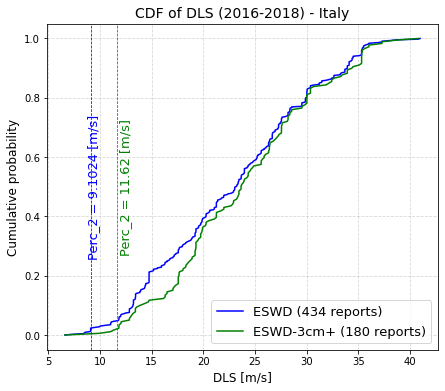

In [276]:
fig, ax = plt.subplots(figsize = (7,6))

data = ITA_gdf_sp_4ESWDh_nn_Aggr_2016_2018[sp_par]
data_3cm = ITA_gdf_sp_4ESWDh_nn_Aggr_2016_2018_3cm[sp_par]

#sort data
x = np.sort(data)
x_3cm = np.sort(data_3cm)

#calculate CDF values
y = 1. * np.arange(len(data)) / (len(data) - 1)
y_3cm = 1. * np.arange(len(data_3cm)) / (len(data_3cm) - 1)

#plot CDF
ax.plot(x, y, color='blue', label='ESWD (434 reports)')
ax.plot(x_3cm, y_3cm, color='green', label='ESWD-3cm+ (180 reports)')

ax.set_xlabel(f'{sp_par} ' + f'{un_meas}', fontsize=12)
ax.set_ylabel('Cumulative probability', fontsize=12)
ax.set_title(f'CDF of {sp_par} (2016-2018) - Italy', fontsize=14);

plt.axvline(x=np.percentile(x,percent), lw=0.75, linestyle='--', color='blue')
plt.axvline(x=np.percentile(x_3cm,percent), lw=0.75, linestyle='--', color='green')

plt.text(np.percentile(x,percent)*(1-0.04), .5, f"Perc_{percent} = {np.percentile(x,percent):.5} {un_meas}", 
         rotation=90, verticalalignment='center', color='blue', fontsize=13)
plt.text(np.percentile(x_3cm,percent)*(1+0.02), .5, f"Perc_{percent} = {np.percentile(x_3cm,percent):.5} {un_meas}", 
         rotation=90, verticalalignment='center', color='green', fontsize=13)

plt.grid(ls='--', alpha=0.5)
plt.legend(loc='best', fontsize=13)

plt.savefig(f'/home/ciccuz/phd/KIT/scripts/plots/CDF_distributions/Italy_only/CDF_{sp_par}_ITA.png', 
            dpi=300, bbox_inches='tight')

1
4
26
27
28
29
30
31
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
78
79
80
81
82
83
84
85
86
148
161
162
168
169
170
171
172
173
179
185
191
193
199
203
216
217
242
243
244
296
344
384
387
401
403
404
405
406
407
408
424
433
436


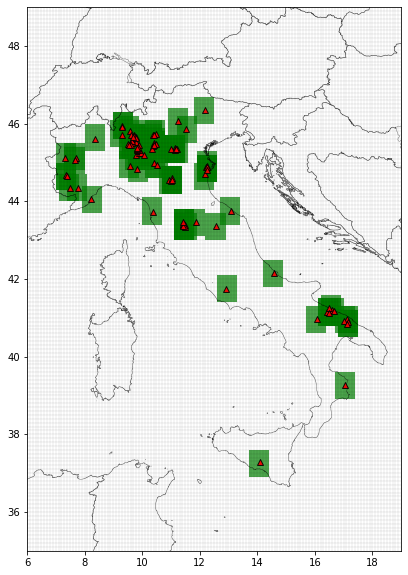

In [161]:
fig, ax = plt.subplots(figsize = (16,10))

ax.set_ylim(y_lim)  #y_lim
ax.set_xlim(x_lim) #x_lim

#grid shapefile
sf_sp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.1, linestyle='--', zorder=2)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

#plot geodataframe of SPHERA data with color_ton as colorcoding
for ind in ITA_dgdf_sp_4ESWDh_nn_2016.keys():
    #print(ind)
    
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        continue
     
    ITA_dgdf_sp_4ESWDh_nn_2016[ind][['H0','geometry']].plot(ax=ax,color='green',alpha=0.7)

c3_1=pl.scatter(ita_eswd_2016.lon,ita_eswd_2016.lat,35,c='red',
                marker="^",edgecolor='k',alpha=0.9,zorder=4)    
    

# Characterize HITTED/MISSED ESWD reports (after Validation) separately

In [7]:
#UPLOAD ESWD DATA AFTER FILTERING:

with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2016 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2017 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2018 = pickle.load(file)

In [8]:
#FILTERED OTs HITTED ESWD REPORTS
filt_eswd_HITTED_2016 = filtOTset_valid_eswd_2016['reports_HITTED_uniq']
filt_eswd_HITTED_2017 = filtOTset_valid_eswd_2017['reports_HITTED_uniq']
filt_eswd_HITTED_2018 = filtOTset_valid_eswd_2018['reports_HITTED_uniq']

filt_eswd_HITTED_2016_2018 = pd.concat([filt_eswd_HITTED_2016,filt_eswd_HITTED_2017,filt_eswd_HITTED_2018])

#FILTERED OTs MISSED ESWD REPORTS
filt_eswd_MISSED_2016_2018 = eswd[~eswd.index.isin(filt_eswd_HITTED_2016_2018.index)]

filt_eswd_MISSED_2016 = filt_eswd_MISSED_2016_2018[filt_eswd_MISSED_2016_2018.datetime.dt.year == 2016]
filt_eswd_MISSED_2017 = filt_eswd_MISSED_2016_2018[filt_eswd_MISSED_2016_2018.datetime.dt.year == 2017]
filt_eswd_MISSED_2018 = filt_eswd_MISSED_2016_2018[filt_eswd_MISSED_2016_2018.datetime.dt.year == 2018]

In [9]:
#filt_eswd_MISSED_2016_2018.drop([128,316,327,328,330,507,632,883,884,929], axis=0, inplace=True)

In [10]:
#UPLOAD SPHERA DATA IN THE SPATIO-TEMPORAL WINDOW AROUND EACH ESWD REPORT:
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2016_Aggr3h-nn.txt', 'rb') as file:
     dgdf_sp_3ESWDh_nn_2016 = pickle.load(file)
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2017_Aggr3h-nn.txt', 'rb') as file:
     dgdf_sp_3ESWDh_nn_2017 = pickle.load(file)
#read dictionary to external file
with open(fold + 'data/SPHERA/sphera_indices_grid10km/eswdDays_3h_nn/SpInd_eswdDays_2018_Aggr3h-nn.txt', 'rb') as file:
     dgdf_sp_3ESWDh_nn_2018 = pickle.load(file)
        
#THE KEYS OF THE DICTS FOR 2017 AND 2018 MUST BE SET EQUAL TO THE INDICES OF ESWD DATASET!!!
dgdf_sp_3ESWDh_nn_2017_Upd = dict()
for key in dgdf_sp_3ESWDh_nn_2017.keys():
    new_key = key+len(dgdf_sp_3ESWDh_nn_2016)
    dgdf_sp_3ESWDh_nn_2017_Upd[new_key] = dgdf_sp_3ESWDh_nn_2017[key]

dgdf_sp_3ESWDh_nn_2018_Upd = dict()
for key in dgdf_sp_3ESWDh_nn_2018.keys():
    new_key = key+len(dgdf_sp_3ESWDh_nn_2016)+len(dgdf_sp_3ESWDh_nn_2017_Upd)
    dgdf_sp_3ESWDh_nn_2018_Upd[new_key] = dgdf_sp_3ESWDh_nn_2018[key]

dgdf_sp_3ESWDh_nn_2017 = dgdf_sp_3ESWDh_nn_2017_Upd
dgdf_sp_3ESWDh_nn_2018 = dgdf_sp_3ESWDh_nn_2018_Upd

In [11]:
#SELECT SUBSET OF SPHERA DATA FOR HITTED ESWD REPORTS:
dgdf_sp_3ESWDh_nn_2016_HITTED = {key: dgdf_sp_3ESWDh_nn_2016[key] for key in filt_eswd_HITTED_2016.index}
dgdf_sp_3ESWDh_nn_2017_HITTED = {key: dgdf_sp_3ESWDh_nn_2017[key] for key in filt_eswd_HITTED_2017.index}
dgdf_sp_3ESWDh_nn_2018_HITTED = {key: dgdf_sp_3ESWDh_nn_2018[key] for key in filt_eswd_HITTED_2018.index}

#aggregate years together:
dgdf_sp_3ESWDh_nn_2016_2018_HITTED = dict(dgdf_sp_3ESWDh_nn_2016_HITTED)
dgdf_sp_3ESWDh_nn_2016_2018_HITTED.update(dgdf_sp_3ESWDh_nn_2017_HITTED)
dgdf_sp_3ESWDh_nn_2016_2018_HITTED.update(dgdf_sp_3ESWDh_nn_2018_HITTED)

#SELECT SUBSET OF SPHERA DATA FOR MISSED ESWD REPORTS:
dgdf_sp_3ESWDh_nn_2016_MISSED = {key: dgdf_sp_3ESWDh_nn_2016[key] for key in filt_eswd_MISSED_2016.index}
dgdf_sp_3ESWDh_nn_2017_MISSED = {key: dgdf_sp_3ESWDh_nn_2017[key] for key in filt_eswd_MISSED_2017.index}
dgdf_sp_3ESWDh_nn_2018_MISSED = {key: dgdf_sp_3ESWDh_nn_2018[key] for key in filt_eswd_MISSED_2018.index}

#aggregate years together:
dgdf_sp_3ESWDh_nn_2016_2018_MISSED = dict(dgdf_sp_3ESWDh_nn_2016_MISSED)
dgdf_sp_3ESWDh_nn_2016_2018_MISSED.update(dgdf_sp_3ESWDh_nn_2017_MISSED)
dgdf_sp_3ESWDh_nn_2016_2018_MISSED.update(dgdf_sp_3ESWDh_nn_2018_MISSED)

In [19]:
#perform spatial aggregation for HITTED events
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_HITTED[24].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_2018_HITTED.keys():
        
    #if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330):
        
    #    continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_HITTED[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_2018_HITTED[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_2018_HITTED[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED.reset_index(drop=True)

#set index to ESWD reports dataset index:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED.set_index(filt_eswd_HITTED_2016_2018.index)

In [20]:
#perform spatial aggregation for MISSED events
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_MISSED[0].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_2018_MISSED.keys():
    
    #avoid reports too close to sphera spatial border domain -> REMOVE THEM FROM ANALYSIS!
    if (ind == 128) or (ind == 316) or (ind == 327) or (ind == 328) or (ind == 330) or (ind == 507) or (ind == 632) or (ind == 883) or (ind == 884) or (ind == 929):
        
        continue
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_MISSED[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_2018_MISSED[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_2018_MISSED[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED.append(temp)

gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED.reset_index(drop=True)

#set index to ESWD reports dataset index:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED.set_index(filt_eswd_MISSED_2016_2018.index)

In [307]:
#subset of eswd reports to be withdrawn (SPHERA data missing, or too close to SPHERA domain border)
#eswd_withdr = eswd.iloc[[128,316,327,328,330,507,632,883,884,929]]

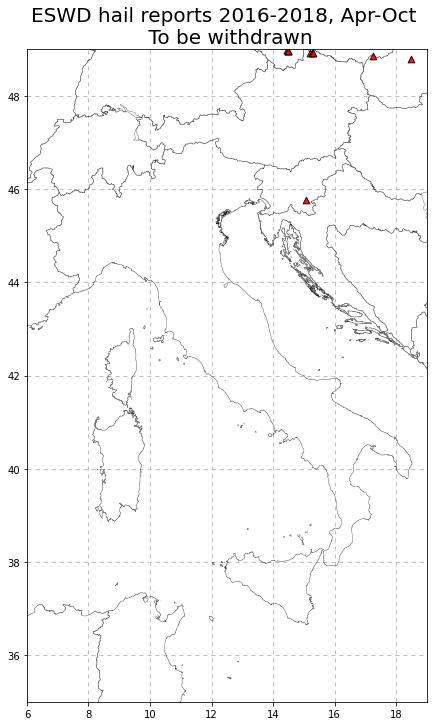

In [152]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

c3_1=pl.scatter(eswd_withdr.lon,eswd_withdr.lat,45,c='red',
                marker="^",edgecolor='k',alpha=0.9,zorder=4)

pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct \n To be withdrawn', fontsize=20);

#### - Cumulative distribution functions of the parameters considering Hitted  and Missed ESWD:

In [509]:
sp_par = 'DLS'

In [25]:
#Thresholds SET WHEN CONSIDERING TEMP WINDOW = 3H,5-95 perc thresholds
t_CAPE = 618.42
t_K = 32.5
t_LI = -2.08
t_DLS = 9.25
t_H0 = 4039

In [511]:
#parameters for different proxies:
if sp_par == 'LI':
    un_meas = '[°C]'  #unit measure for colorbar label
    percent = 95
    thresh = t_LI
elif sp_par == 'Kindex':
    un_meas = '[°C]'
    percent = 5
    thresh = t_K
elif (sp_par == 'CAPE_MU') or (sp_par == 'CAPE_ML'):
    un_meas = '[J/kg]'
    percent = 5
    thresh = t_CAPE
elif sp_par == 'H0':
    un_meas = '[m]'
    percent = 95
    thresh = t_H0
elif sp_par == 'DLS':
    un_meas = '[m/s]'
    percent = 5
    thresh = t_DLS

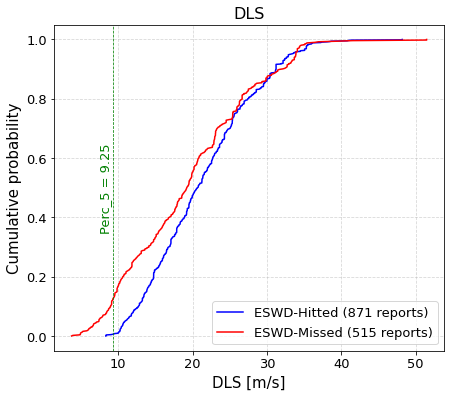

In [514]:
fig, ax = plt.subplots(figsize = (7,6))

data_Hitted = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[sp_par]
data_Missed = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[sp_par]

#sort data
x_Hitted = np.sort(data_Hitted)
x_Missed = np.sort(data_Missed)

#calculate CDF values
y_Hitted = 1. * np.arange(len(data_Hitted)) / (len(data_Hitted) - 1)
y_Missed = 1. * np.arange(len(data_Missed)) / (len(data_Missed) - 1)

#plot CDF
ax.plot(x_Hitted, y_Hitted, color='blue', label='ESWD-Hitted (871 reports)')
ax.plot(x_Missed, y_Missed, color='red', label='ESWD-Missed (515 reports)')

ax.set_xlabel(f'{sp_par} ' + f'{un_meas}', fontsize=15)
ax.set_ylabel('Cumulative probability', fontsize=15)
ax.set_title(f'{sp_par}', fontsize=16);

plt.axvline(x=thresh, lw=0.75, linestyle='--', color='green')

plt.text(thresh*(1-0.2), .5, f"Perc_{percent} = {thresh}", 
         rotation=90, verticalalignment='center', color='green', fontsize=13)

ax.tick_params(axis='both', which='major', labelsize=13)
plt.grid(ls='--', alpha=0.5)
plt.legend(loc='best', fontsize=13)

plt.savefig(f'/home/ciccuz/phd/KIT/scripts/plots/CDF_distributions/3hFilter/ESWD_validation_hit-miss/FullSets/CDF_{sp_par}.pdf', 
            dpi=300, bbox_inches='tight')

<span style="color:black"> **VERY STRANGE THING**: some eswd reports are hitted even if they should be filtered out!! See below: some reports have spatio-temporal SPHERA aggregations parameters having lower/higher values than thresholds!! **HOW IS THIS POSSIBLE??** </span>

Actually it is possible since the filtering is applied around each OT **AND NOT AROUND EACH ESWD REPORT**!!!!

In [294]:
x_Hitted_H0 = x_Hitted

In [215]:
x_Hitted_LI = x_Hitted

In [221]:
x_Hitted_K = x_Hitted

In [227]:
x_Hitted_CAPE_MU = x_Hitted

In [313]:
x_Hitted_DLS = x_Hitted

In [337]:
x_Missed_H0 = x_Missed

In [342]:
x_Missed_LI = x_Missed

In [351]:
x_Missed_K = x_Missed

In [356]:
x_Missed_CAPE_MU = x_Missed

In [327]:
x_Missed_DLS = x_Missed

In [314]:
x_Hitted_DLS[x_Hitted_DLS<9.25]

array([8.31430626, 8.31430626, 8.37071991, 8.37071991, 9.03828716,
       9.21362209])

In [315]:
x_Hitted_CAPE_MU[x_Hitted_CAPE_MU<618.42]

array([478.158325, 478.158325, 478.158325, 530.849976, 535.806274,
       557.900024, 569.083313, 611.493774, 612.200012, 612.200012,
       612.200012])

In [238]:
x_Hitted_K[x_Hitted_K<32.5]

array([], dtype=float64)

In [239]:
x_Hitted_LI[x_Hitted_LI>-2.08]

array([-2.03864002, -1.95627367, -1.92875826, -1.92875826, -1.89408791,
       -1.64412558, -1.59178793, -1.32566512, -1.13829422, -0.37087375,
       -0.37087375,  0.95878202])

In [240]:
x_Hitted_H0[x_Hitted_H0>4039]

array([4040.09204, 4067.20776, 4067.20776, 4069.84131, 4069.84131,
       4075.65454, 4076.93115, 4088.77344, 4094.80005])

In [358]:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_belowTHRESH = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED.loc[(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED['H0'].isin(x_Hitted_H0[x_Hitted_H0>4039])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED['LI'].isin(x_Hitted_LI[x_Hitted_LI>-2.08])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED['CAPE_MU'].isin(x_Hitted_CAPE_MU[x_Hitted_CAPE_MU<618.42])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED['DLS'].isin(x_Hitted_CAPE_MU[x_Hitted_CAPE_MU<618.42])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED['Kindex'].isin(x_Hitted_K[x_Hitted_K<32.5]))]

In [361]:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_belowTHRESH = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED.loc[(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED['H0'].isin(x_Missed_H0[x_Missed_H0>4039])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED['LI'].isin(x_Missed_LI[x_Missed_LI>-2.08])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED['CAPE_MU'].isin(x_Missed_CAPE_MU[x_Missed_CAPE_MU<618.42])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED['DLS'].isin(x_Missed_CAPE_MU[x_Missed_CAPE_MU<618.42])) |
                                          (gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED['Kindex'].isin(x_Missed_K[x_Missed_K<32.5]))]

In [364]:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_belowTHRESH

,datetime_agg,box_id,%VV700,Kindex,LI,DLS,H0,CAPE_MU,CAPE_ML,geometry
121,2016-05-27 20:00:00,NaN,100.000000,34.129665,-2.081848,18.814158,3459.54419,612.200012,383.841675,None
122,2016-05-27 20:00:00,NaN,100.000000,34.129665,-2.081848,18.814158,3459.54419,612.200012,383.841675,None
123,2016-05-27 20:00:00,NaN,78.947365,34.427887,-2.081848,19.509832,3459.54419,612.200012,383.841675,None
210,2016-06-25 18:00:00,NaN,100.000000,34.966568,-2.670829,10.522383,3861.89697,530.849976,346.458344,None
220,2016-06-27 12:00:00,NaN,100.000000,38.696960,-2.747794,26.943863,3273.31665,478.158325,219.483337,None
221,2016-06-27 12:00:00,NaN,100.000000,38.696960,-2.747794,26.943863,3273.31665,478.158325,219.483337,None
222,2016-06-27 12:00:00,NaN,100.000000,38.696960,-2.747794,26.943863,3273.31665,478.158325,219.483337,None
336,2016-07-23 18:00:00,NaN,100.000000,37.225834,-1.928758,14.874257,3726.53687,1000.904170,470.066681,None
335,2016-07-23 18:00:00,NaN,100.000000,36.703247,-1.928758,14.874257,3704.65967,1000.904170,470.066681,None
385,2016-08-05 23:00:00,NaN,100.000000,39.752472,-1.591788,32.843483,3606.86719,626.230286,408.289459,None


In [362]:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_belowTHRESH

,datetime_agg,box_id,%VV700,Kindex,LI,DLS,H0,CAPE_MU,CAPE_ML,geometry
0,2016-04-06 16:00:00,NaN,100.000000,33.604656,-2.085889,15.847551,2270.31250,286.437500,136.796875,None
3,2016-04-08 04:00:00,NaN,93.333336,30.302052,7.663734,18.190380,2481.96094,174.648438,0.137500,None
5,2016-04-12 13:00:00,NaN,100.000000,31.579523,-1.976746,20.732588,1956.57812,532.982788,356.995300,None
6,2016-04-12 14:00:00,NaN,100.000000,27.915955,-0.146336,26.895628,2016.23071,351.100006,221.687500,None
7,2016-04-12 14:00:00,NaN,100.000000,27.422359,-0.005491,26.895628,2016.23071,326.243744,205.037506,None
...,...,...,...,...,...,...,...,...,...,...
1257,2018-07-06 13:00:00,NaN,100.000000,34.621502,-0.729394,10.271379,3390.84155,251.007812,94.929688,None
1293,2018-07-16 02:00:00,NaN,100.000000,40.232948,-1.122500,33.238754,3658.77490,1551.518800,139.708328,None
1294,2018-07-16 02:00:00,NaN,100.000000,40.232948,-1.383438,31.222982,3670.48120,1509.108280,432.450012,None
1339,2018-08-01 15:00:00,NaN,100.000000,38.133171,-3.378665,18.090637,4076.81934,1099.433350,856.833313,None


### - Separate also between hitted/missed eswd reports with small/large hail:

In [12]:
#eswd reports hitted with small/large hail
filt_eswd_HITTED_2016_2018_small = filt_eswd_HITTED_2016_2018[filt_eswd_HITTED_2016_2018['size']<3]
filt_eswd_HITTED_2016_2018_large = filt_eswd_HITTED_2016_2018[filt_eswd_HITTED_2016_2018['size']>=3]

#select SPHERA subset presentin HITTED eswd event - small hail:
dgdf_sp_3ESWDh_nn_2016_2018_HITTED_small = {key: dgdf_sp_3ESWDh_nn_2016_2018_HITTED[key] for key in filt_eswd_HITTED_2016_2018_small.index}
#select SPHERA subset presentin HITTED eswd event - large hail:
dgdf_sp_3ESWDh_nn_2016_2018_HITTED_large = {key: dgdf_sp_3ESWDh_nn_2016_2018_HITTED[key] for key in filt_eswd_HITTED_2016_2018_large.index}


#eswd reports missed with small/large hail
filt_eswd_MISSED_2016_2018_small = filt_eswd_MISSED_2016_2018[filt_eswd_MISSED_2016_2018['size']<3]
filt_eswd_MISSED_2016_2018_large = filt_eswd_MISSED_2016_2018[filt_eswd_MISSED_2016_2018['size']>=3]

#select SPHERA subset presentin MISSED eswd event - small hail:
dgdf_sp_3ESWDh_nn_2016_2018_MISSED_small = {key: dgdf_sp_3ESWDh_nn_2016_2018_MISSED[key] for key in filt_eswd_MISSED_2016_2018_small.index}
#select SPHERA subset presentin HITTED eswd event - large hail:
dgdf_sp_3ESWDh_nn_2016_2018_MISSED_large = {key: dgdf_sp_3ESWDh_nn_2016_2018_MISSED[key] for key in filt_eswd_MISSED_2016_2018_large.index}

In [13]:
#perform spatial aggregation for HITTED events with small hail
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_HITTED_small[24].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_2018_HITTED_small.keys():
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_HITTED_small[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_2018_HITTED_small[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_2018_HITTED_small[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small.append(temp)

#set index to ESWD reports dataset index:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small.set_index(filt_eswd_HITTED_2016_2018_small.index)

In [14]:
#perform spatial aggregation for HITTED events with large hail
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_HITTED_large[25].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_2018_HITTED_large.keys():
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_HITTED_large[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_2018_HITTED_large[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_2018_HITTED_large[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large.append(temp)

#set index to ESWD reports dataset index:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large.set_index(filt_eswd_HITTED_2016_2018_large.index)

In [15]:
#perform spatial aggregation for MISSED events with small hail
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_MISSED_small[2].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_2018_MISSED_small.keys():
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_MISSED_small[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_2018_MISSED_small[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_2018_MISSED_small[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small.append(temp)

#set index to ESWD reports dataset index:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small.set_index(filt_eswd_MISSED_2016_2018_small.index)

In [16]:
#perform spatial aggregation for MISSED events with large hail
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_MISSED_large[10].columns)

for ind in dgdf_sp_3ESWDh_nn_2016_2018_MISSED_large.keys():
        
    temp = gpd.GeoDataFrame(columns=dgdf_sp_3ESWDh_nn_2016_2018_MISSED_large[ind].columns)
    
    temp[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']] = dgdf_sp_3ESWDh_nn_2016_2018_MISSED_large[ind].groupby(['datetime_agg'], as_index=False).max()[['datetime_agg','%VV700','Kindex','DLS','CAPE_MU','CAPE_ML']]
    temp[['LI','H0']] = dgdf_sp_3ESWDh_nn_2016_2018_MISSED_large[ind].groupby(['datetime_agg'], as_index=False).min()[['LI','H0']]

    gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large.append(temp)

#set index to ESWD reports dataset index:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large.set_index(filt_eswd_MISSED_2016_2018_large.index)

In [446]:
sp_par = 'DLS'

In [447]:
#parameters for different proxies:
if sp_par == 'LI':
    un_meas = '[°C]'  #unit measure for colorbar label
    percent = 95
    thresh = t_LI
elif sp_par == 'Kindex':
    un_meas = '[°C]'
    percent = 5
    thresh = t_K
elif (sp_par == 'CAPE_MU') or (sp_par == 'CAPE_ML'):
    un_meas = '[J/kg]'
    percent = 5
    thresh = t_CAPE
elif sp_par == 'H0':
    un_meas = '[m]'
    percent = 95
    thresh = t_H0
elif sp_par == 'DLS':
    un_meas = '[m/s]'
    percent = 5
    thresh = t_DLS

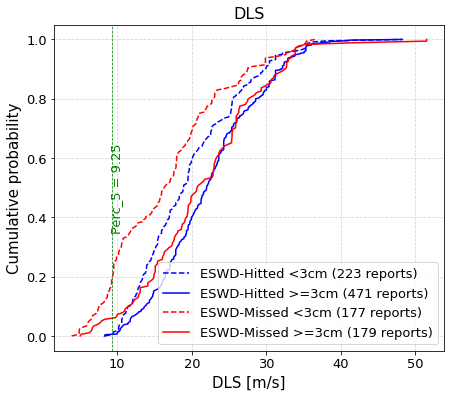

In [448]:
fig, ax = plt.subplots(figsize = (7,6))

data_Hitted_small = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[sp_par]
data_Hitted_large = gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[sp_par]

data_Missed_small = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[sp_par]
data_Missed_large = gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[sp_par]

#sort data
x_Hitted_small = np.sort(data_Hitted_small)
x_Hitted_large = np.sort(data_Hitted_large)
x_Missed_small = np.sort(data_Missed_small)
x_Missed_large = np.sort(data_Missed_large)

#calculate CDF values
y_Hitted_small = 1. * np.arange(len(data_Hitted_small)) / (len(data_Hitted_small) - 1)
y_Hitted_large = 1. * np.arange(len(data_Hitted_large)) / (len(data_Hitted_large) - 1)
y_Missed_small = 1. * np.arange(len(data_Missed_small)) / (len(data_Missed_small) - 1)
y_Missed_large = 1. * np.arange(len(data_Missed_large)) / (len(data_Missed_large) - 1)

#plot CDF
ax.plot(x_Hitted_small, y_Hitted_small, color='blue', ls='--', label='ESWD-Hitted <3cm (223 reports)')
ax.plot(x_Hitted_large, y_Hitted_large, color='blue', label='ESWD-Hitted >=3cm (471 reports)')

ax.plot(x_Missed_small, y_Missed_small, color='red', ls='--', label='ESWD-Missed <3cm (177 reports)')
ax.plot(x_Missed_large, y_Missed_large, color='red', label='ESWD-Missed >=3cm (179 reports)')

ax.set_xlabel(f'{sp_par} ' + f'{un_meas}', fontsize=15)
ax.set_ylabel('Cumulative probability', fontsize=15)
ax.set_title(f'{sp_par}', fontsize=16);

plt.axvline(x=thresh, lw=0.75, linestyle='--', color='green')

plt.text(thresh*(1-0.02), .5, f"Perc_{percent} = {thresh}", 
         rotation=90, verticalalignment='center', color='green', fontsize=13)

ax.tick_params(axis='both', which='major', labelsize=13)
plt.grid(ls='--', alpha=0.5)
plt.legend(loc='best', fontsize=13)

plt.savefig(f'/home/ciccuz/phd/KIT/scripts/plots/CDF_distributions/3hFilter/ESWD_validation_hit-miss/small-large_Hail/CDF_{sp_par}.pdf', 
            dpi=300, bbox_inches='tight')

In [425]:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large

,datetime_agg,box_id,%VV700,Kindex,LI,DLS,H0,CAPE_MU,CAPE_ML,geometry
10,2016-04-14 10:00:00,NaN,100.000000,34.436394,-2.121081,26.283789,2309.82495,643.174316,383.954041,None
68,2016-05-19 14:00:00,NaN,94.736839,34.194923,-5.143188,19.213528,2317.23120,1079.009400,779.525024,None
93,2016-05-27 14:00:00,NaN,86.666664,34.687817,-5.550823,25.405567,3242.38281,1847.421020,1446.032840,None
97,2016-05-27 15:00:00,NaN,88.235291,39.204918,-7.716805,24.189691,3251.86719,2634.983400,2109.449950,None
102,2016-05-27 15:00:00,NaN,94.117645,36.254379,-5.577603,25.405567,3242.38281,1936.199950,1548.883300,None
...,...,...,...,...,...,...,...,...,...,...
1353,2018-08-13 14:00:00,NaN,95.000000,36.689136,-2.473823,18.140455,3663.40625,658.191650,343.212494,None
1374,2018-09-02 14:00:00,NaN,100.000000,38.022873,-5.188437,23.442554,3104.52490,1499.931270,1277.318730,None
1376,2018-09-02 15:00:00,NaN,100.000000,38.809120,-6.035421,27.217350,3170.69531,2034.073490,1689.139650,None
1383,2018-09-18 16:00:00,NaN,100.000000,32.868225,-5.014019,7.893144,3483.26660,1245.507320,679.316650,None


## - 2D phase space between different SPHERA parameters

In [22]:
#aggregate Hitted/Missed events together:
gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL = pd.concat([gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED,
                                                 gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED])

In [23]:
#setup bins for each parameter:
cape_bins = np.linspace(0, 7000, 20)
h0_bins = np.linspace(1300, 4600, 20)
dls_bins = np.linspace(0, 50, 20)
K_bins = np.linspace(25, 50, 20)
LI_bins = np.linspace(-15, 8, 20)

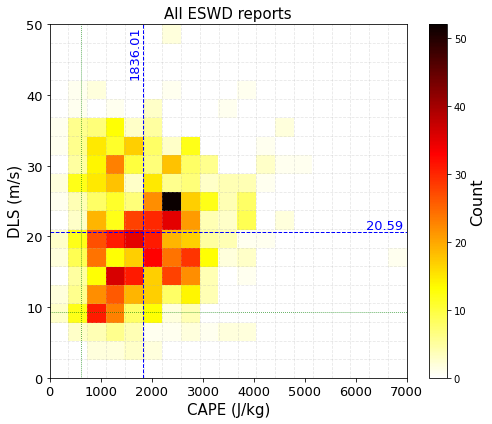

In [81]:
x_thresh = t_CAPE
y_thresh = t_DLS

fig, ax = plt.subplots(figsize =(8, 6.5))

ax.set_xticks(cape_bins, minor=True)
ax.set_yticks(dls_bins, minor=True)
# Creating plot
plt.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['CAPE_MU'], gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['DLS'],
          bins=[cape_bins,dls_bins], cmap='hot_r');
plt.colorbar().set_label(label='Count',size=16)
ax.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
ax.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')

ax.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['CAPE_MU']), lw=1, linestyle='--', color='blue')
ax.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['DLS']), lw=1, linestyle='--', color='blue')

plt.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['CAPE_MU'])-300, 46, 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['CAPE_MU']):.2f}", rotation=90, verticalalignment='center', 
         color='blue', fontsize=13)
plt.text(6200, np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['DLS']), 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['DLS']):.2f}", rotation=0, verticalalignment='bottom', 
         color='blue', fontsize=13)

ax.grid(which='minor', alpha=0.3, ls='--')
plt.tick_params(axis='both', which='minor',bottom=False,left=False,labelbottom=False)

ax.tick_params(axis='both', which='major', labelsize=13)
ax.set_ylabel('DLS (m/s)', fontsize=15)
ax.set_xlabel('CAPE (J/kg)', fontsize=15)
ax.set_title('All ESWD reports', fontsize=15);

In [28]:
np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL['CAPE_MU'])

1836.0052898672434

In [112]:
x_thresh = t_CAPE
x_bins = cape_bins
x_lab = 'CAPE (J/kg)'

In [113]:
y_thresh = t_K
y_bins = K_bins
y_lab = 'K (°C)'

In [118]:
x_bins[-3]

6263.1578947368425

In [156]:
#WRITE FUNCTIONS OF 2D HISTOGRAM PLOTS BY SELECTING TWO PARAMETERS:
#ALL-HIT-MISS histograms

def Hist2d_hitMiss(par_x,par_y):
    
    #parameters for different proxies:
    if par_x == 'LI':
        x_thresh = t_LI
        x_bins = LI_bins
        x_lab = 'SLI (°C)'
    elif par_x == 'Kindex':
        x_thresh = t_K
        x_bins = K_bins
        x_lab = 'K (°C)'
    elif par_x == 'CAPE_MU':
        x_thresh = t_CAPE
        x_bins = cape_bins
        x_lab = 'CAPE (J/kg)'
    elif par_x == 'H0':
        x_thresh = t_H0
        x_bins = h0_bins
        x_lab = 'H0 (m)'
    elif par_x == 'DLS':
        x_thresh = t_DLS
        x_bins = dls_bins
        x_lab = 'DLS (m/s)'

    if par_y == 'LI':
        y_thresh = t_LI
        y_bins = LI_bins
        y_lab = 'SLI (°C)'
    elif par_y == 'Kindex':
        y_thresh = t_K
        y_bins = K_bins
        y_lab = 'K (°C)'
    elif par_y == 'CAPE_MU':
        y_thresh = t_CAPE
        y_bins = cape_bins
        y_lab = 'CAPE (J/kg)'
    elif par_y == 'H0':
        y_thresh = t_H0
        y_bins = h0_bins
        y_lab = 'H0 (m)'
    elif par_y == 'DLS':
        y_thresh = t_DLS
        y_bins = dls_bins
        y_lab = 'DLS (m/s)'
    
    #2d HISTOGRAMS SEPARATING BETWEEN ALL, HITTED AND MISSED ESWD REPORTS

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,5))

    hist1 = ax1.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_x], gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_y],
              bins=[x_bins,y_bins], cmap='hot_r', vmin=0, vmax=50);
    plt.colorbar(hist1[3], ax=ax1).set_label(label='Count',size=16)
    ax1.grid(which='minor', alpha=0.3, ls='--')
    ax1.set_xticks(x_bins, minor=True)
    ax1.set_yticks(y_bins, minor=True)
    ax1.tick_params(axis='both', which='minor', bottom=False, left=False, labelbottom=False)
    ax2.tick_params(labelsize=13)
    ax1.set_ylabel(y_lab, fontsize=15)
    ax1.set_xlabel(x_lab, fontsize=15)
    ax1.set_title('All ESWD reports', fontsize=15);
    ax1.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
    ax1.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')
    ax1.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_x]), lw=1, linestyle='--', color='blue')
    ax1.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_y]), lw=1, linestyle='--', color='blue')
    ax1.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_x]), y_bins[-3], 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_x]):.2f}", rotation=90,  ha='right', va='center', 
         color='blue', fontsize=13)
    ax1.text(x_bins[-4], np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_y]), 
             f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_ALL[par_y]):.2f}", rotation=0, va='bottom', 
             color='blue', fontsize=13)


    hist2 = ax2.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_x], gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_y],
              bins=[x_bins,y_bins], cmap='hot_r', vmin=0, vmax=50);
    plt.colorbar(hist2[3], ax=ax2).set_label(label='Count',size=16)
    ax2.grid(which='minor', alpha=0.3, ls='--')
    ax2.set_xticks(x_bins, minor=True)
    ax2.set_yticks(y_bins, minor=True)
    ax2.tick_params(axis='both', which='minor', bottom=False, left=False, labelbottom=False)
    ax2.tick_params(labelsize=12)
    ax2.set_ylabel(y_lab, fontsize=15)
    ax2.set_xlabel(x_lab, fontsize=15)
    ax2.set_title('Hitted ESWD reports', fontsize=15);
    ax2.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
    ax2.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')
    ax2.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_x]), lw=1, linestyle='--', color='blue')
    ax2.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_y]), lw=1, linestyle='--', color='blue')
    ax2.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_x]), y_bins[-3], 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_x]):.2f}", rotation=90,  ha='right', va='center', 
         color='blue', fontsize=13)
    ax2.text(x_bins[-4], np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_y]), 
             f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED[par_y]):.2f}", rotation=0, va='bottom', 
             color='blue', fontsize=13)
    
    hist3 = ax3.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_x], gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_y],
              bins=[x_bins,y_bins], cmap='hot_r', vmin=0, vmax=50);
    plt.colorbar(hist3[3], ax=ax3).set_label(label='Count',size=16)
    ax3.grid(which='minor', alpha=0.3, ls='--')
    ax3.set_xticks(x_bins, minor=True)
    ax3.set_yticks(y_bins, minor=True)
    ax3.tick_params(axis='both', which='minor', bottom=False, left=False, labelbottom=False)
    ax3.tick_params(labelsize=12)
    ax3.set_ylabel(y_lab, fontsize=15)
    ax3.set_xlabel(x_lab, fontsize=15)
    ax3.set_title('Missed ESWD reports', fontsize=15);
    ax3.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
    ax3.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')
    ax3.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_x]), lw=1, linestyle='--', color='blue')
    ax3.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_y]), lw=1, linestyle='--', color='blue')
    ax3.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_x]), y_bins[-3], 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_x]):.2f}", rotation=90, ha='right', va='center',
         color='blue', fontsize=13)
    ax3.text(x_bins[-4], np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_y]), 
             f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED[par_y]):.2f}", rotation=0, va='bottom', 
             color='blue', fontsize=13)

In [168]:
#WRITE FUNCTIONS OF 2D HISTOGRAM PLOTS BY SELECTING TWO PARAMETERS:
#HIT-MISS and LARGE-SMALL hail histograms
def Hist2d_LargeSmallHail_hitMiss(par_x,par_y):
    
    #parameters for different proxies:
    if par_x == 'LI':
        x_thresh = t_LI
        x_bins = LI_bins
        x_lab = 'SLI (°C)'
    elif par_x == 'Kindex':
        x_thresh = t_K
        x_bins = K_bins
        x_lab = 'K (°C)'
    elif par_x == 'CAPE_MU':
        x_thresh = t_CAPE
        x_bins = cape_bins
        x_lab = 'CAPE (J/kg)'
    elif par_x == 'H0':
        x_thresh = t_H0
        x_bins = h0_bins
        x_lab = 'H0 (m)'
    elif par_x == 'DLS':
        x_thresh = t_DLS
        x_bins = dls_bins
        x_lab = 'DLS (m/s)'

    if par_y == 'LI':
        y_thresh = t_LI
        y_bins = LI_bins
        y_lab = 'SLI (°C)'
    elif par_y == 'Kindex':
        y_thresh = t_K
        y_bins = K_bins
        y_lab = 'K (°C)'
    elif par_y == 'CAPE_MU':
        y_thresh = t_CAPE
        y_bins = cape_bins
        y_lab = 'CAPE (J/kg)'
    elif par_y == 'H0':
        y_thresh = t_H0
        y_bins = h0_bins
        y_lab = 'H0 (m)'
    elif par_y == 'DLS':
        y_thresh = t_DLS
        y_bins = dls_bins
        y_lab = 'DLS (m/s)'
    
    #2d HISTOGRAMS SEPARATING BETWEEN HITTED AND MISSED and LARGE AND SMALL HAIL ESWD REPORTS

    fig, ((ax1, ax2), (ax3,ax4)) = plt.subplots(2, 2, figsize=(14,12))

    hist1 = ax1.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_x], 
                       gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_y],
                       bins=[x_bins,y_bins], cmap='hot_r', vmin=0, vmax=25);
    plt.colorbar(hist1[3], ax=ax1).set_label(label='Count',size=16)
    ax1.grid(which='minor', alpha=0.3, ls='--')
    ax1.set_xticks(x_bins, minor=True)
    ax1.set_yticks(y_bins, minor=True)
    ax1.tick_params(axis='both', which='minor', bottom=False, left=False, labelbottom=False)
    ax2.tick_params(labelsize=13)
    ax1.set_ylabel(y_lab, fontsize=15)
    ax1.set_xlabel(x_lab, fontsize=15)
    ax1.set_title('Hitted - Large hail ESWD reports', fontsize=15);
    ax1.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
    ax1.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')
    ax1.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_x]), lw=1, linestyle='--', color='blue')
    ax1.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_y]), lw=1, linestyle='--', color='blue')
    ax1.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_x]), y_bins[-3], 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_x]):.2f}", rotation=90,  ha='right', va='center', 
         color='blue', fontsize=13)
    ax1.text(x_bins[-4], np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_y]), 
             f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_large[par_y]):.2f}", rotation=0, va='bottom', 
             color='blue', fontsize=13)


    hist2 = ax2.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_x], 
                       gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_y],
                       bins=[x_bins,y_bins], cmap='hot_r', vmin=0, vmax=25);
    plt.colorbar(hist2[3], ax=ax2).set_label(label='Count',size=16)
    ax2.grid(which='minor', alpha=0.3, ls='--')
    ax2.set_xticks(x_bins, minor=True)
    ax2.set_yticks(y_bins, minor=True)
    ax2.tick_params(axis='both', which='minor', bottom=False, left=False, labelbottom=False)
    ax2.tick_params(labelsize=12)
    ax2.set_ylabel(y_lab, fontsize=15)
    ax2.set_xlabel(x_lab, fontsize=15)
    ax2.set_title('Hitted - Small hail ESWD reports', fontsize=15);
    ax2.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
    ax2.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')
    ax2.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_x]), lw=1, linestyle='--', color='blue')
    ax2.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_y]), lw=1, linestyle='--', color='blue')
    ax2.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_x]), y_bins[-3], 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_x]):.2f}", rotation=90,  ha='right', va='center', 
         color='blue', fontsize=13)
    ax2.text(x_bins[-4], np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_y]), 
             f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_HITTED_small[par_y]):.2f}", rotation=0, va='bottom', 
             color='blue', fontsize=13)


    hist3 = ax3.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_x], 
                       gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_y],
                       bins=[x_bins,y_bins], cmap='hot_r', vmin=0, vmax=25);
    plt.colorbar(hist3[3], ax=ax3).set_label(label='Count',size=16)
    ax3.grid(which='minor', alpha=0.3, ls='--')
    ax3.set_xticks(x_bins, minor=True)
    ax3.set_yticks(y_bins, minor=True)
    ax3.tick_params(axis='both', which='minor', bottom=False, left=False, labelbottom=False)
    ax3.tick_params(labelsize=12)
    ax3.set_ylabel(y_lab, fontsize=15)
    ax3.set_xlabel(x_lab, fontsize=15)
    ax3.set_title('Missed - Large hail ESWD reports', fontsize=15);
    ax3.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
    ax3.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')
    ax3.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_x]), lw=1, linestyle='--', color='blue')
    ax3.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_y]), lw=1, linestyle='--', color='blue')
    ax3.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_x]), y_bins[-3], 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_x]):.2f}", rotation=90,  ha='right', va='center', 
         color='blue', fontsize=13)
    ax3.text(x_bins[-4], np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_y]), 
             f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_large[par_y]):.2f}", rotation=0, va='bottom', 
             color='blue', fontsize=13)


    hist4 = ax4.hist2d(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_x], 
                       gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_y],
                       bins=[x_bins,y_bins], cmap='hot_r', vmin=0, vmax=25);
    plt.colorbar(hist4[3], ax=ax4).set_label(label='Count',size=16)
    ax4.grid(which='minor', alpha=0.3, ls='--')
    ax4.set_xticks(x_bins, minor=True)
    ax4.set_yticks(y_bins, minor=True)
    ax4.tick_params(axis='both', which='minor', bottom=False, left=False, labelbottom=False)
    ax4.tick_params(labelsize=12)
    ax4.set_ylabel(y_lab, fontsize=15)
    ax4.set_xlabel(x_lab, fontsize=15)
    ax4.set_title('Missed - Small hail ESWD reports', fontsize=15);
    ax4.axvline(x=x_thresh, lw=0.75, linestyle=':', color='green')
    ax4.axhline(y=y_thresh, lw=0.75, linestyle=':', color='green')
    ax4.axvline(x=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_x]), lw=1, linestyle='--', color='blue')
    ax4.axhline(y=np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_y]), lw=1, linestyle='--', color='blue')
    ax4.text(np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_x]), y_bins[-3], 
         f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_x]):.2f}", rotation=90,  ha='right', va='center', 
         color='blue', fontsize=13)
    ax4.text(x_bins[-4], np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_y]), 
             f"{np.mean(gdf_sp_3ESWDh_nn_Aggr_2016_2018_MISSED_small[par_y]):.2f}", rotation=0, va='bottom', 
             color='blue', fontsize=13)

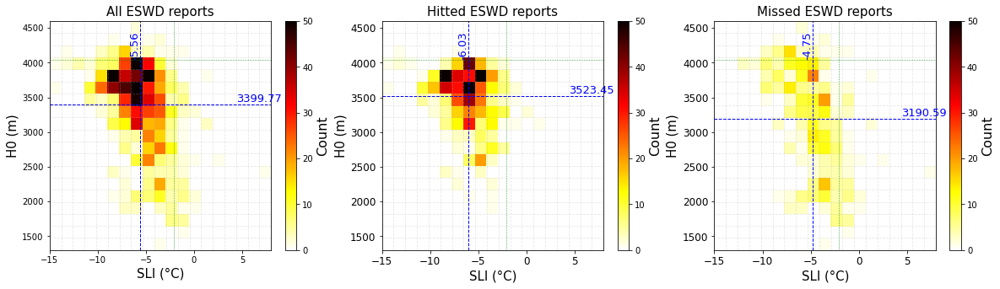

In [165]:
par_x = 'LI'
par_y = 'H0'

Hist2d_hitMiss(par_x,par_y)

plt.savefig(f'/home/ciccuz/phd/KIT/scripts/plots/CDF_distributions/3hFilter/ESWD_validation_hit-miss/2dHistograms/pdfs/hitMiss_2dHist_{par_x}_{par_y}.pdf', 
            dpi=300, bbox_inches='tight')

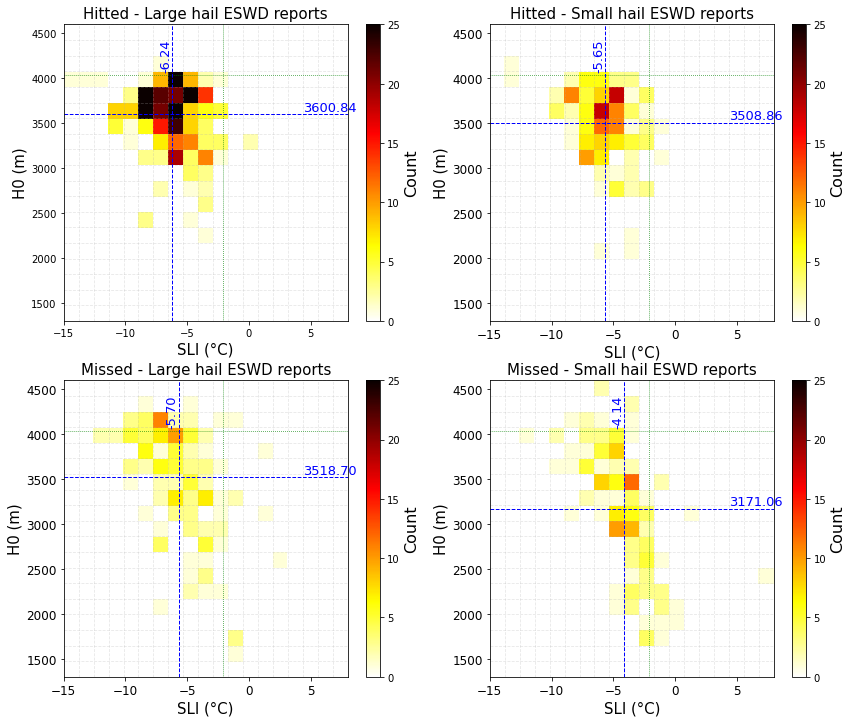

In [178]:
par_x = 'LI'
par_y = 'H0'

Hist2d_LargeSmallHail_hitMiss(par_x,par_y)

plt.savefig(f'/home/ciccuz/phd/KIT/scripts/plots/CDF_distributions/3hFilter/ESWD_validation_hit-miss/2dHistograms/pdfs/LargeSmall_hitMiss_2dHist_{par_x}_{par_y}.pdf', 
            dpi=300, bbox_inches='tight')